# 1) Effect of Normalization, FeatureExtraction and Distance Metrics

# Libraries Used

Pandas was used to handle the Dataframes and to make the statistics calculations like mean, standard deviation, variance, skewness and mode.

Numpy was used to handle arrays and to perform different calculations.

Scikit learn an open-source machine learning library for Python and contains a helpful preprocessing module that can help us do the data preprocessing, PCA, LDA, Manifold Learning methods, accuracy, data splitting, solving algorithms.

Seaborn, matlab was used to build the subplots, plots.

Math is for all mathematical calculations

Timeit is used to measure execution time of small code snippets

# First I have did all the tasks by taking Color as output label then I took Quality as label and again followed the same steps to complete all the tasks.

In [1]:
# Importing libraries
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="ticks", color_codes=True)
import math
import timeit

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

In [2]:
#Columns/Features
D = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']
L = 'quality'
C = 'color'
DL = D + [L]
DC = D + [C]
DLC = DL + [C]
DCL = DC + [L]

#Loading Data set
wine_r = pd.read_csv("winequality-red.csv", sep=';')
#Loading Data set
wine_w = pd.read_csv("winequality-white.csv", sep=';')
wine_w= wine_w.copy()
wine_w[C]= np.zeros(wine_w.shape[0])
wine_r[C]= np.ones(wine_r.shape[0])
wine = pd.concat([wine_w,wine_r],ignore_index=True)
final_wine = wine[DCL]
print(wine)

      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0               7.0             0.270         0.36            20.7      0.045   
1               6.3             0.300         0.34             1.6      0.049   
2               8.1             0.280         0.40             6.9      0.050   
3               7.2             0.230         0.32             8.5      0.058   
4               7.2             0.230         0.32             8.5      0.058   
...             ...               ...          ...             ...        ...   
6492            6.2             0.600         0.08             2.0      0.090   
6493            5.9             0.550         0.10             2.2      0.062   
6494            6.3             0.510         0.13             2.3      0.076   
6495            5.9             0.645         0.12             2.0      0.075   
6496            6.0             0.310         0.47             3.6      0.067   

      free sulfur dioxide  

# Pairplot Without Normalization With Color As Output label

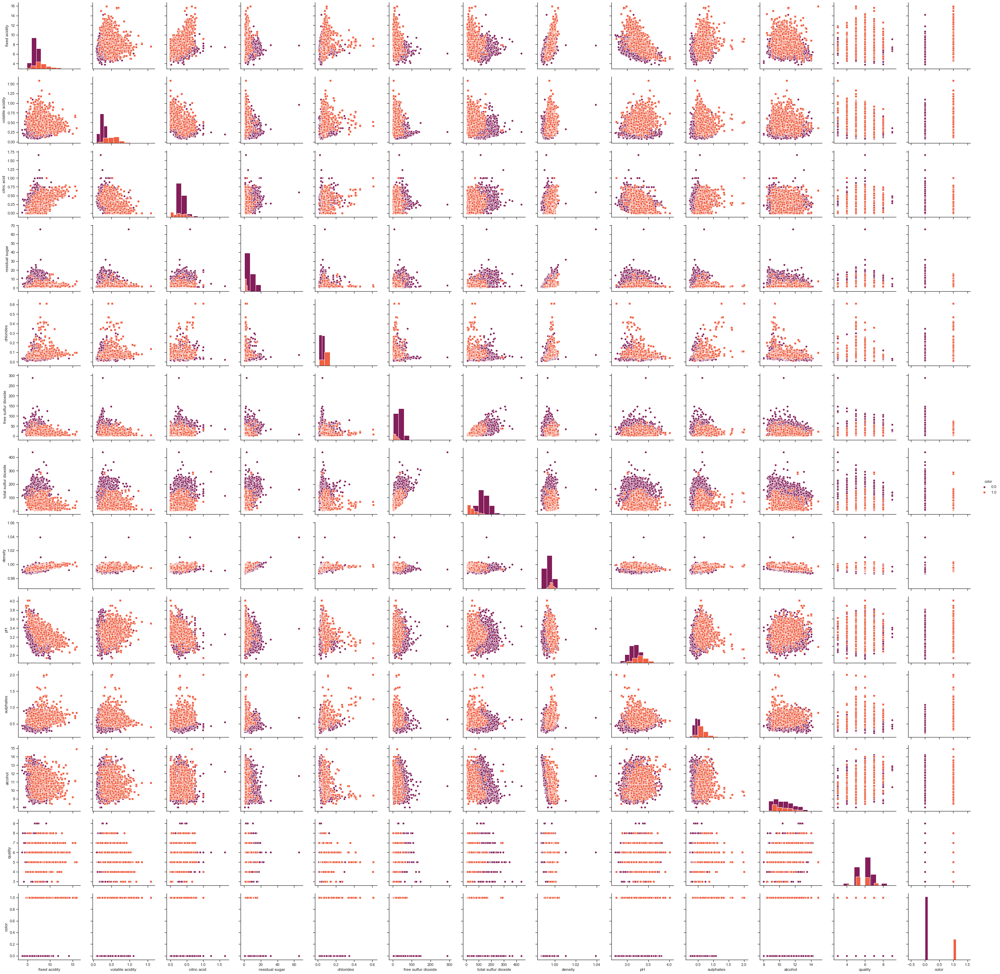

In [3]:
#Pairplot without Normalization taking color as output label
sns.pairplot(wine, diag_kind='hist', height=3, hue='color', palette="rocket", markers=["o","s"])

# Data Preprocessing With Color As Output Label

In [4]:
#Separating Features and Target
wine = wine.loc[:, :]
print(wine.head())

labels = wine['color']
wine.drop(columns = ['color'], inplace = True)
print(wine.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.0              0.27         0.36            20.7      0.045   
1            6.3              0.30         0.34             1.6      0.049   
2            8.1              0.28         0.40             6.9      0.050   
3            7.2              0.23         0.32             8.5      0.058   
4            7.2              0.23         0.32             8.5      0.058   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 45.0                 170.0   1.0010  3.00       0.45   
1                 14.0                 132.0   0.9940  3.30       0.49   
2                 30.0                  97.0   0.9951  3.26       0.44   
3                 47.0                 186.0   0.9956  3.19       0.40   
4                 47.0                 186.0   0.9956  3.19       0.40   

   alcohol  quality  color  
0      8.8        6    0.0  
1      9.5        6    0.0  

# Pairplot With Z-Score Normalization With Color As Output Label

Z-score normalization also called as standardization, it scales data to fit a normal distribution with a mean of 0 and a standard deviation of 1. This normalization can be done using the function z = preprocessing.StandardScaler().fit_transform(df), as shown below.

In [5]:
#Standardizing the features
wine = StandardScaler().fit_transform(wine)
print(wine)

[[-0.16608919 -0.42318303  0.28468605 ... -0.54617826 -1.41855821
   0.20799905]
 [-0.70607349 -0.24094936  0.14704613 ... -0.27735097 -0.83161516
   0.20799905]
 [ 0.68245757 -0.36243847  0.55996589 ... -0.61338508 -0.32852111
   0.20799905]
 ...
 [-0.70607349  1.03468634 -1.29817304 ...  1.47002637  0.42611996
   0.20799905]
 [-1.01463595  1.85473786 -1.366993   ...  1.20119908 -0.2446721
  -0.93722961]
 [-0.93749534 -0.1802048   1.04170561 ...  0.86516498  0.42611996
   0.20799905]]


From above values we could see that, z-score normalization has scaled all data to fit a normal distribution. We could see that all columns have a mean of 0 and a standard deviation of approximately 1. We could see z scores are positive and negative. Positive z score indicates its corresponding raw score is above the mean. Negative z score indicates its corresponding raw score is below the mean.

In [6]:
#Adding 'Color' label to dataset
df = pd.DataFrame(wine)
df.columns = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']
print(df.head())
df['color'] = labels
print(df.head())
df.shape

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0      -0.166089         -0.423183     0.284686        3.206929  -0.314975   
1      -0.706073         -0.240949     0.147046       -0.807837  -0.200790   
2       0.682458         -0.362438     0.559966        0.306208  -0.172244   
3      -0.011808         -0.666161     0.009406        0.642523   0.056126   
4      -0.011808         -0.666161     0.009406        0.642523   0.056126   

   free sulfur dioxide  total sulfur dioxide   density        pH  sulphates  \
0             0.815565              0.959976  2.102214 -1.359049  -0.546178   
1            -0.931107              0.287618 -0.232332  0.506915  -0.277351   
2            -0.029599             -0.331660  0.134525  0.258120  -0.613385   
3             0.928254              1.243074  0.301278 -0.177272  -0.882212   
4             0.928254              1.243074  0.301278 -0.177272  -0.882212   

    alcohol   quality  
0 -1.418558  0.207999  
1 -0.831

(6497, 13)

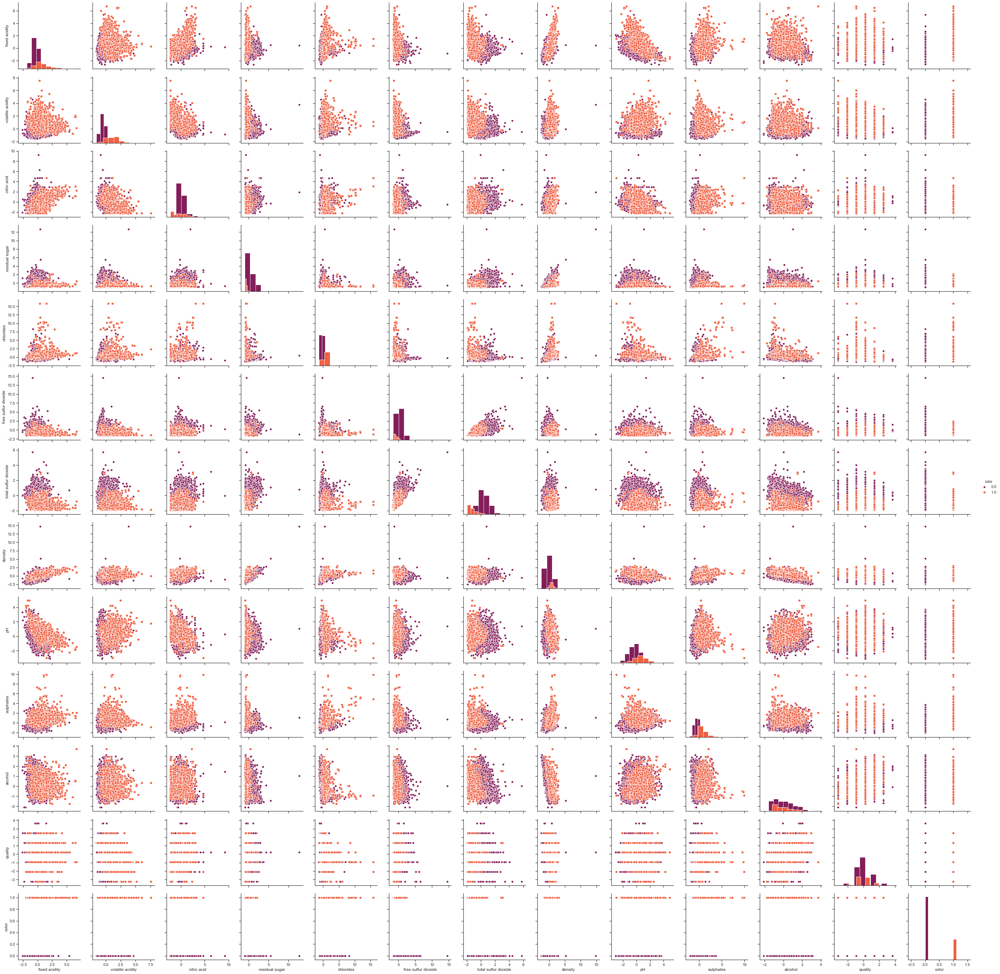

In [7]:
#Pairplot with z-score normalization With Color As Output Label
sns.pairplot(df, diag_kind='hist', height=3, hue='color', palette="rocket", markers=["o","s"])

From the above two pair plots, we could see that all features are contributing equally and data was scaled by keeping mean=0 and standard deviation=1. We could see that it is having better feaure separability due to having only 2 classes. While data still looks squished, we notice that the points are now on roughly the same scale for all the features after performing z score normalization.It used to compare raw scores that are taken from different tests especially when the data are at the interval of management. Plot between Total sulfur dioxide vs PH are having better feature separability.

Applying standardized data on dimensionality reduction methods like LDA, PCA, FDA, t-sna we can extract the features more efficiently.

# KNN Classifier With Normalized data taking Color As Output Label

In [8]:
#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(wine, labels, test_size=0.2, random_state = ran)
print(X_train.shape)
print(X_test.shape)

(5197, 12)
(1300, 12)


# Uniform Weighting (default)

In [9]:
#KNN Classifier using Color as output and uniform as weighting 
n_neighborslist = list(range(1,50))
col_names=['uniform']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_uniform=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0])
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_uniform.at[k,col_names[0]] = accscore

acc_uniform.describe()
acc_uniform.head()

,uniform
0,0.000000
1,0.992308
2,0.990769
3,0.991538
4,0.993077


# Distance Based Weight with Manhattan Distance

In [10]:
#KNN Classifier using Color as output, P=1(manhattan) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_man=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=1)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_man.at[k,col_names[0]] = accscore

acc_man.describe()
acc_man.head()

,distance
0,0.000000
1,0.993846
2,0.993846
3,0.994615
4,0.994615


# Distance Based Weight with Euclidean Distance

In [11]:
#KNN Classifier using Color as output, P=2(Euclidean) and distance as weighting scheme

n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_euc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0],p=2)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_euc.at[k,col_names[0]] = accscore

acc_euc.describe()
acc_euc.head()

,distance
0,0.000000
1,0.992308
2,0.992308
3,0.993077
4,0.993077


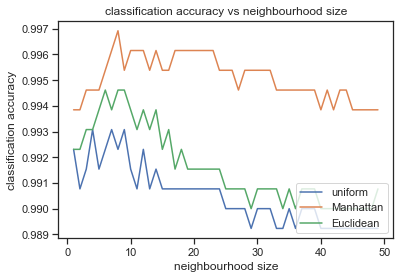

In [12]:
plt.plot(acc_uniform[1:],label="uniform")
plt.plot(acc_man[1:],label="Manhattan")
plt.plot(acc_euc[1:],label="Euclidean")
plt.legend(loc='lower right')
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')
plt.show()

From above graph, we could see that manhattan with z-score normalization has the highest accuracy at K=7, where as weighting scheme with uniform and euclidean experience a bit less accuracy when compared with manhattan. I have selected best value of K as 7 for manhattan with z-score because it is having high accuracy, confusion matrix and a better speed of convergence of rate when compared with remaining k-values. For weighting scheme as euclidean we got high accuracy at k=3,7,9 and throught the graph as k value goes on increases it results in decreasing the accuracy. For weighting scheme as uniform we got high accuracy at k=5,7,8 and throught the graph as k value goes on increases it results in decreasing the accuracy. 

# Feature Selection

Feature selection gives you a score for each feature of your data, the higher the score more important is the feature towards your output label.

Feature selection is an inbuilt class that comes with Tree Based Classifiers, we will be using Extra Tree Classifier for extracting the top 4 features for the dataset.

[0.08011409 0.13467236 0.03442259 0.07411486 0.12438192 0.05242833
 0.26095149 0.1066132  0.03987506 0.06488334 0.01741005 0.01013272]


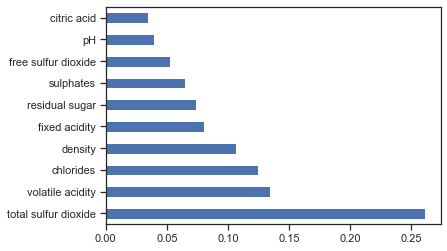

In [13]:
#Performing Feature Selection

from sklearn.ensemble import ExtraTreesClassifier
wine_data = wine
wine_data = pd.DataFrame(wine_data, columns= ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality'])
model = ExtraTreesClassifier()
model.fit(wine_data,labels)
print(model.feature_importances_)
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=wine_data.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

Based on above figure where color as output, i have selected total sulfur dioxide, volatile acidity, chlorides and density as top 4 features subset having high feature importance and scores. I have tested the performance of those features on the best weighting scheme manhattan with z score normalization and the results are shown below.

# Improving Performance On Normalized data Using Selected Features

In [14]:
#Separating Features and Target (taking color as output label)

X = wine_data[['volatile acidity','chlorides', 'total sulfur dioxide', 'density']]
Y = labels

In [15]:

#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state = ran) 

In [16]:
#KNN Classifier using Color as output and P=1

n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0],p=1)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc.at[k,col_names[0]] = accscore

acc.describe()
acc.head()

,distance
0,0.000000
1,0.988462
2,0.988462
3,0.986154
4,0.989231


Text(0, 0.5, 'classification accuracy')

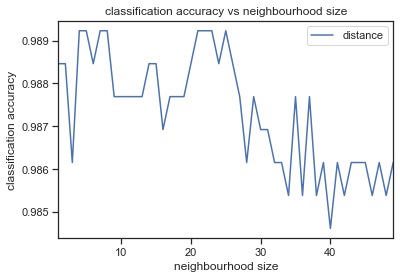

In [17]:
acc[1:].plot.line()
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')

From above graph after testing the performance using selected features with manhattan with z-score normalization, we can say that model is performing well with highest accuracy of 98.9 at k=4,5,7,8,25. However, as the k values increases it experiences fluctuations in accuracies. 

I have performed feature selection for different subset of features, different weighting schemes but none of the features except the above method gave better accuracy.

# Feature extraction using PCA With Normalized data taking Color As Output Label

Now, we perform a PCA on the standardized dataset to transform the dataset onto a 2-dimensional feature subspace.

In [18]:
#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(wine, labels, test_size=0.2, random_state = ran)
print(X_train.shape)
print(X_test.shape)

(5197, 12)
(1300, 12)


In [19]:
# Fitting PCA on train data and transform test data
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
print(X_train.shape)
print(X_test.shape)

(5197, 5)
(1300, 5)


# Running The Same KNN Weighting Schemes For PCA

In [20]:
#KNN Classifier using PCA, Color as output and uniform as weighting 
n_neighborslist = list(range(1,50))
col_names=['uniform']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_uniform=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0])
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_uniform.at[k,col_names[0]] = accscore

acc_uniform.describe()
acc_uniform.head()

,uniform
0,0.000000
1,0.990769
2,0.986154
3,0.986923
4,0.984615


In [21]:
#KNN Classifier using PCA, Color as output, P=1(manhattan) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_man=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=1)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_man.at[k,col_names[0]] = accscore

acc_man.describe()
acc_man.head()

,distance
0,0.000000
1,0.990769
2,0.990769
3,0.990769
4,0.990769


In [22]:
#KNN Classifier using PCA, Color as output, P=2(Euclidean) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_euc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=2)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_euc.at[k,col_names[0]] = accscore

acc_euc.describe()
acc_euc.head()

,distance
0,0.000000
1,0.990769
2,0.990769
3,0.990000
4,0.990000


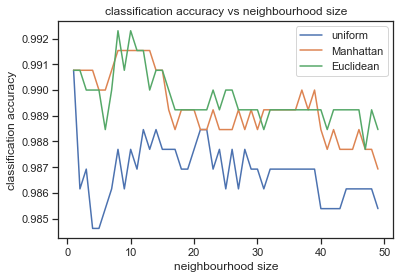

In [23]:
plt.plot(acc_uniform[1:],label="uniform")
plt.plot(acc_man[1:],label="Manhattan")
plt.plot(acc_euc[1:],label="Euclidean")
plt.legend(loc='upper right')
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')
plt.show()

From above graph, KNN after fitting the model with PCA experiences almost same accuracy whwn compared with without normalization. We could see that euclidean with z-score normalization has the highest accuracy at K=7,11 where as weighting scheme with uniform and manhattan experience a bit less accuracy when compared with eucliden. I have selected best value of K as 7 for manhattan with z-score because it is having high accuracy, confusion matrix and a better speed of convergence of rate when compared with remaining k-values. For weighting scheme as manhattan we got high accuracy at k=7,13 and throught the graph as k value goes on increases it results in decreasing the accuracy. For weighting scheme as uniform we got high accuracy at k=2 and throught the graph as k value goes on increases it results in decreasing the accuracy. 

# Feature extraction using LDA With Normalized data taking Color As Output Label

In [24]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

sklearn_lda = LDA()
#X_lda = sklearn_lda.fit_transform(wine, labels)
X_lda = sklearn_lda.fit(wine, labels)
LDA_comp = X_lda.transform(wine)
print(LDA_comp.shape)

(6497, 1)


In [25]:
#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(LDA_comp, labels, test_size=0.2, random_state = ran)
print(X_train.shape)
print(X_test.shape)

(5197, 1)
(1300, 1)


# Running The Same KNN Weighting Schemes For LDA

In [26]:
#KNN Classifier using PCA, Color as output and uniform as weighting 
n_neighborslist = list(range(1,50))
col_names=['uniform']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_uniform=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0])
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_uniform.at[k,col_names[0]] = accscore

acc_uniform.describe()
acc_uniform.head()

,uniform
0,0.000000
1,0.991538
2,0.991538
3,0.991538
4,0.992308


In [27]:
#KNN Classifier using PCA, Color as output, P=1(manhattan) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_man=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=1)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_man.at[k,col_names[0]] = accscore

acc_man.describe()
acc_man.head()

,distance
0,0.000000
1,0.991538
2,0.991538
3,0.992308
4,0.993077


In [28]:
#KNN Classifier using PCA, Color as output, P=2(Euclidean) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_euc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=2)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_euc.at[k,col_names[0]] = accscore

acc_euc.describe()
acc_euc.head()

,distance
0,0.000000
1,0.991538
2,0.991538
3,0.992308
4,0.993077


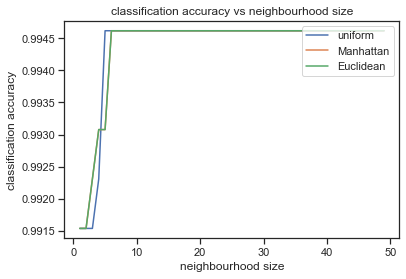

In [29]:
plt.plot(acc_uniform[1:],label="uniform")
plt.plot(acc_man[1:],label="Manhattan")
plt.plot(acc_euc[1:],label="Euclidean")
plt.legend(loc='upper right')
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')
plt.show()

From above graph, KNN after fitting the model with LDA experiences a better accuracy when compared with KNN with PCA. We could see that all the three wighting schemes are giving almost same accuracies at same or consecutive values. Euclidean and Manhattan in LDA are giving same accuracies throughout the graph. Feature extraction in LDA is having performed very well when compared with PCA. At K=7 we got higest accuracy in LDA where as in PCA we got less accuracy.

# Performing All The Above Tasks With Quality As Output Label

In [52]:
#Displaying the Data with quality as output label
print(final_wine.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.0              0.27         0.36            20.7      0.045   
1            6.3              0.30         0.34             1.6      0.049   
2            8.1              0.28         0.40             6.9      0.050   
3            7.2              0.23         0.32             8.5      0.058   
4            7.2              0.23         0.32             8.5      0.058   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 45.0                 170.0   1.0010  3.00       0.45   
1                 14.0                 132.0   0.9940  3.30       0.49   
2                 30.0                  97.0   0.9951  3.26       0.44   
3                 47.0                 186.0   0.9956  3.19       0.40   
4                 47.0                 186.0   0.9956  3.19       0.40   

   alcohol  color  quality  
0      8.8    0.0        6  
1      9.5    0.0        6  

# Pairplot Without Normalization taking Quality as output

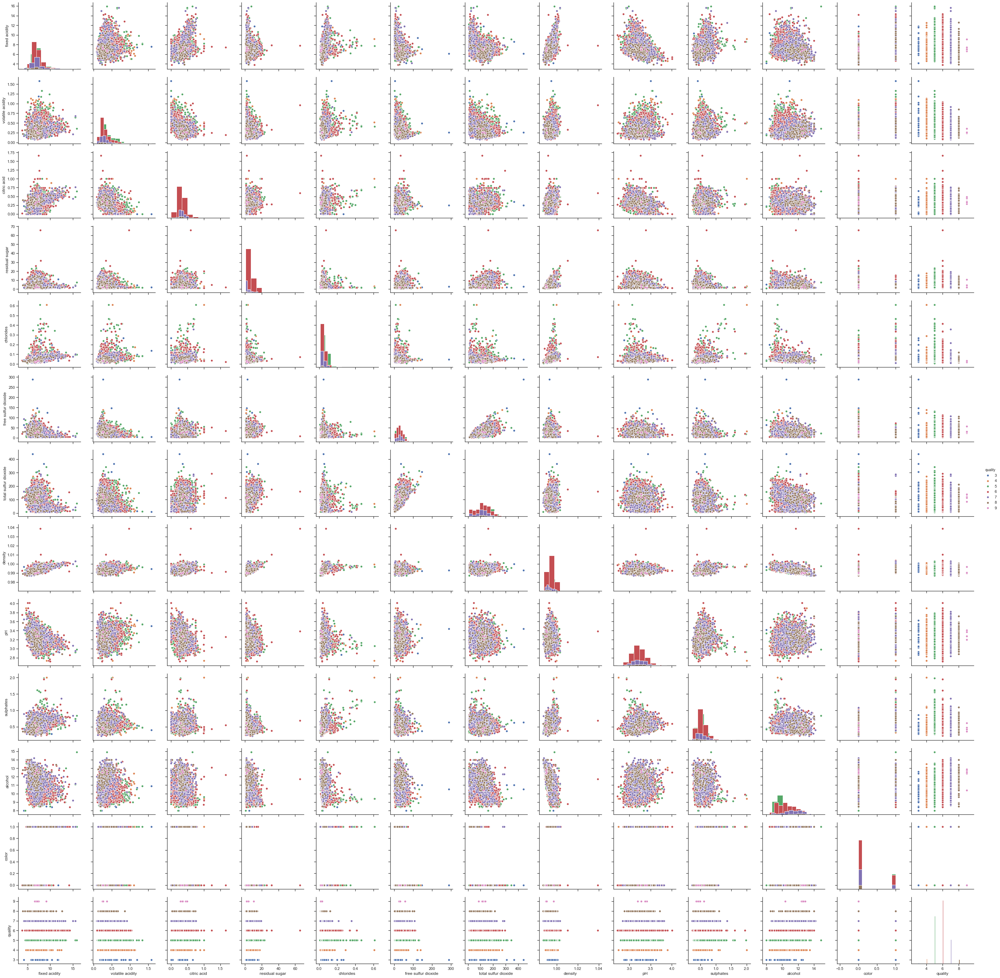

In [53]:
#Pairplot without Normalization taking color as output label
sns.pairplot(final_wine, diag_kind='hist', height=3, hue='quality')

# Data Preprocessing With Quality as Output Label

In [54]:
#Separating Features and Target
final_wine = final_wine.loc[:, :]
print(final_wine.head())

labels = final_wine['quality']
final_wine.drop(columns = ['quality'], inplace = True)
print(final_wine.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.0              0.27         0.36            20.7      0.045   
1            6.3              0.30         0.34             1.6      0.049   
2            8.1              0.28         0.40             6.9      0.050   
3            7.2              0.23         0.32             8.5      0.058   
4            7.2              0.23         0.32             8.5      0.058   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 45.0                 170.0   1.0010  3.00       0.45   
1                 14.0                 132.0   0.9940  3.30       0.49   
2                 30.0                  97.0   0.9951  3.26       0.44   
3                 47.0                 186.0   0.9956  3.19       0.40   
4                 47.0                 186.0   0.9956  3.19       0.40   

   alcohol  color  quality  
0      8.8    0.0        6  
1      9.5    0.0        6  

c:\users\admin\appdata\local\programs\python\python37-32\lib\site-packages\pandas\core\frame.py:4117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


# Pairplot With Z-Score Normalization With Quality As Output Label

Z-score normalization also called as standardization, it scales data to fit a normal distribution with a mean of 0 and a standard deviation of 1. This normalization can be done using the function z = preprocessing.StandardScaler().fit_transform(df), as shown below.

In [55]:
#Standardizing the features
final_wine = StandardScaler().fit_transform(final_wine)
print(final_wine)

[[-0.16608919 -0.42318303  0.28468605 ... -0.54617826 -1.41855821
  -0.57136659]
 [-0.70607349 -0.24094936  0.14704613 ... -0.27735097 -0.83161516
  -0.57136659]
 [ 0.68245757 -0.36243847  0.55996589 ... -0.61338508 -0.32852111
  -0.57136659]
 ...
 [-0.70607349  1.03468634 -1.29817304 ...  1.47002637  0.42611996
   1.75018984]
 [-1.01463595  1.85473786 -1.366993   ...  1.20119908 -0.2446721
   1.75018984]
 [-0.93749534 -0.1802048   1.04170561 ...  0.86516498  0.42611996
   1.75018984]]


From above values we could see that, z-score normalization has scaled all data to fit a normal distribution. We could see that all columns have a mean of 0 and a standard deviation of approximately 1. We could see z scores are positive and negative. Positive z score indicates its corresponding raw score is above the mean. Negative z score indicates its corresponding raw score is below the mean.

In [56]:
#Adding 'quality' label to dataset
df_quality = pd.DataFrame(final_wine)
df_quality.columns = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'color']
print(df_quality.head())
df_quality['quality'] = labels
print(df_quality.head())
df_quality.shape

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0      -0.166089         -0.423183     0.284686        3.206929  -0.314975   
1      -0.706073         -0.240949     0.147046       -0.807837  -0.200790   
2       0.682458         -0.362438     0.559966        0.306208  -0.172244   
3      -0.011808         -0.666161     0.009406        0.642523   0.056126   
4      -0.011808         -0.666161     0.009406        0.642523   0.056126   

   free sulfur dioxide  total sulfur dioxide   density        pH  sulphates  \
0             0.815565              0.959976  2.102214 -1.359049  -0.546178   
1            -0.931107              0.287618 -0.232332  0.506915  -0.277351   
2            -0.029599             -0.331660  0.134525  0.258120  -0.613385   
3             0.928254              1.243074  0.301278 -0.177272  -0.882212   
4             0.928254              1.243074  0.301278 -0.177272  -0.882212   

    alcohol     color  
0 -1.418558 -0.571367  
1 -0.831

(6497, 13)

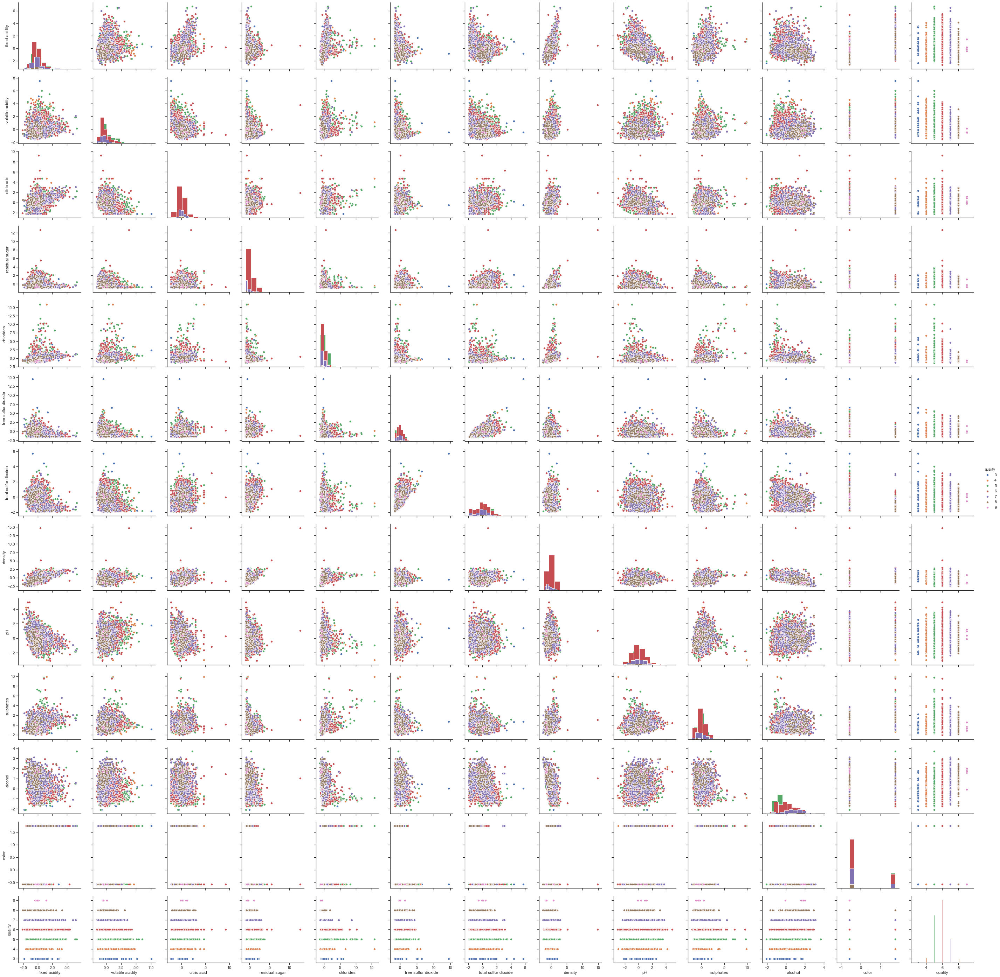

In [57]:
#Pairplot with z-score normalization
sns.pairplot(df_quality, diag_kind='hist', height=3, hue='quality')

From the above two pair plots,  we can see that due to more number of classes the feature separability is not clear and looking like a mesh. We could see that all features are contributing equally and data was scaled by keeping mean=0 and standard deviation=1. While data still looks squished, we notice that the points are now on roughly the same scale for all the features after performing z score normalization.It used to compare raw scores that are taken from different tests especially when the data are at the interval of management.

Applying standardized data on dimensionality reduction methods like LDA, PCA, FDA, t-sna we can extract the features more efficiently.

# KNN Classifier With Normalized data taking Quality As Output Label

In [58]:
#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(final_wine, labels, test_size=0.2, random_state = ran)
print(X_train.shape)
print(X_test.shape)

(5197, 12)
(1300, 12)


# Uniform Weighting (default)

In [59]:
#KNN Classifier using Quality as output and uniform as weighting 
n_neighborslist = list(range(1,50))
col_names=['uniform']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_uniform=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0])
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_uniform.at[k,col_names[0]] = accscore

acc_uniform.describe()
acc_uniform.head()

,uniform
0,0.000000
1,0.630000
2,0.582308
3,0.568462
4,0.571538


# Distance Based Weight with Manhattan Distance

In [63]:
#KNN Classifier using Quality as output, P=1(manhattan) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_man=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=1)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_man.at[k,col_names[0]] = accscore

acc_man.describe()
acc_man.head()

,distance
0,0.000000
1,0.641538
2,0.641538
3,0.657692
4,0.652308


# Distance Based Weight with Euclidean Distance

In [64]:
#KNN Classifier using Quality as output, P=2(Euclidean) and distance as weighting scheme

n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_euc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0],p=2)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_euc.at[k,col_names[0]] = accscore

acc_euc.describe()
acc_euc.head()

,distance
0,0.000000
1,0.630000
2,0.630000
3,0.663077
4,0.661538


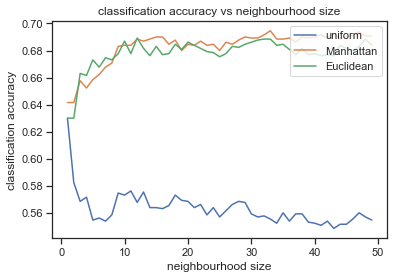

In [65]:
plt.plot(acc_uniform[1:],label="uniform")
plt.plot(acc_man[1:],label="Manhattan")
plt.plot(acc_euc[1:],label="Euclidean")
plt.legend(loc='upper right')
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')
plt.show()

From above graph, we could see that manhattan with z-score normalization is having high accuracy with better speed of convergence, confusion matrix of almost 70% at k=33 where as euclidean is sightly less. In uniform weighting scheme, As the k value increases there is a continuous decrease in accuracy of graph. In Manhattan and Euclidean, as the k value increases accuracy will increases and results in less classification error. We know that in KNN, large value of K results in high bias and low variance, underfits the model, smoother decision boundaries. 

# Feature Selection

[0.07860234 0.09979146 0.08230328 0.08379656 0.08187787 0.08589168
 0.08849138 0.09051802 0.08238792 0.08519178 0.13393146 0.00721624]


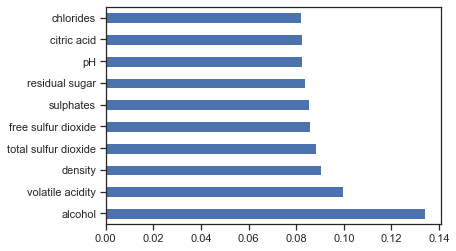

In [66]:
#Performing Feature Selection
from sklearn.ensemble import ExtraTreesClassifier
wine_da = final_wine
wine_da = pd.DataFrame(wine_da, columns= ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'color'])
model = ExtraTreesClassifier()
model.fit(wine_da,labels)
print(model.feature_importances_)
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=wine_da.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

Based on above figure where quality as output, i have selected total sulfur dioxide, volatile acidity, alcohol and density as top 4 features subset having high feature importance and scores. I have tested the performance of those features on the best weighting scheme manhattan, euclidean with z score normalization and the results are shown below.

In [67]:
#Separating Features and Target (taking color as output label)
#X = Wine_data[['fixed acidity', 'residual sugar', 'free sulfur dioxide', 'total sulfur dioxide']]
#X = Wine_data[['fixed acidity', 'chlorides', 'total sulfur dioxide', 'alcohol']]
X = wine_da[['volatile acidity','alcohol', 'total sulfur dioxide', 'density']]
#X = Wine_data[['pH', 'sulphates', 'alcohol', 'quality']]
#X = Wine_data.iloc[:,0:12]
Y = labels

# Improving Performance With Normalized data Using Selected Features

In [68]:
#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state = ran) 

In [75]:
#KNN Classifier using Quality as output and P=2

n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0],p=2)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc.at[k,col_names[0]] = accscore

acc.describe()
acc.head()

,distance
0,0.000000
1,0.638462
2,0.638462
3,0.653077
4,0.657692


Text(0, 0.5, 'classification accuracy')

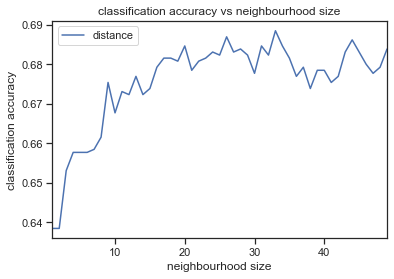

In [76]:
acc[1:].plot.line()
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')

From above graph, after performing feature selction on euclidean and manhattan with top 4 subset of features we can say that euclidean is performing better when compared with manhattan and uniform. At k=33, we got the accuracy of almost 69% which is better when compared with all the features. We found that four features whch we have selected are performing better than considering all the features. As the K value incrases the accuracy also goes on increasing with decreasing classification error.

# Feature Extraction Using PCA With Normalized data taking Quality As Output Label

In [77]:
#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(final_wine, labels, test_size=0.2, random_state = ran)
print(X_train.shape)
print(X_test.shape)

(5197, 12)
(1300, 12)


In [79]:
# Fitting PCA on train data and transform test data
from sklearn.decomposition import PCA
pca = PCA(n_components = 5)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
print(X_train.shape)
print(X_test.shape)

(5197, 5)
(1300, 5)


In [80]:
df_reduced12 = pd.DataFrame(X_train)
df_reduced12.columns = ['Projection on PC1','Projection on PC2','Projection on PC3','Projection on PC4','Projection on PC5']
df_reduced12['quality'] = labels
print(df_reduced12.head())
df_reduced12.shape

   Projection on PC1  Projection on PC2  Projection on PC3  Projection on PC4  \
0          -2.134056           1.232037          -0.317865          -0.177378   
1          -1.161441          -0.006418           1.641107          -1.321027   
2          -0.368430          -0.685514          -0.004543          -0.033876   
3          -1.974761          -0.697012           0.626675          -1.234967   
4           5.678325           3.510540           1.855757           3.012799   

   Projection on PC5  quality  
0          -0.586955        6  
1          -0.711545        6  
2          -1.975824        6  
3          -0.272706        6  
4          -5.433730        6  


(5197, 6)

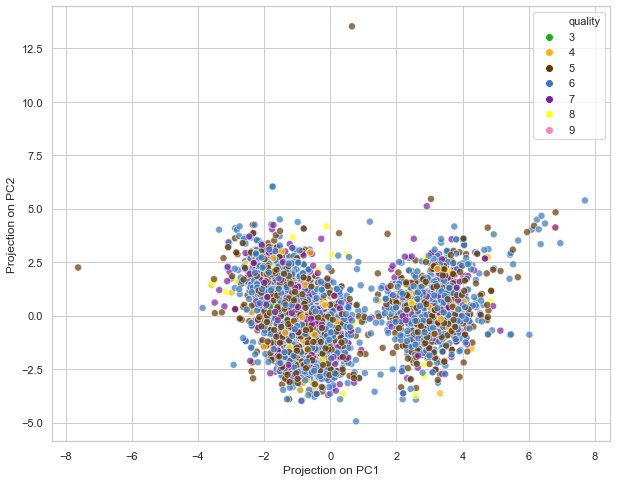

In [81]:
#Plotting PCA1 and PCA2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple", "yellow", "pink"]
sns.scatterplot(ax = ax, x="Projection on PC1", y="Projection on PC2", alpha = 0.7, s = 50,
                hue="quality", data=df_reduced12, palette=sns.xkcd_palette(colors))

From above scatter plot between PC1 vs PC2, we can say that separability is not clear and we cannot diiferentiate the classes accurately due to closely meshed. It is having high variance and high bias, high error and less speed of convergence which is not suitable. In order to get better separability we need to use optimization techniques and different dimensionality reduction method like LDA. 

# Running The Same KNN Weighting Schemes For PCA

In [119]:
#KNN Classifier using PCA, Quality as output and uniform as weighting 
n_neighborslist = list(range(1,50))
col_names=['uniform']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_uniform=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0])
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_uniform.at[k,col_names[0]] = accscore

acc_uniform.describe()
acc_uniform.head()

,uniform
0,0.000000
1,0.633077
2,0.560769
3,0.539231
4,0.551538


In [120]:
#KNN Classifier using PCA, Quality as output, P=1(manhattan) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_man=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=1)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_man.at[k,col_names[0]] = accscore

acc_man.describe()
acc_man.head()

,distance
0,0.000000
1,0.627692
2,0.627692
3,0.618462
4,0.630000


In [121]:
#KNN Classifier using PCA, Quality as output, P=2(Euclidean) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_euc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=2)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_euc.at[k,col_names[0]] = accscore

acc_euc.describe()
acc_euc.head()

,distance
0,0.000000
1,0.633077
2,0.633077
3,0.633846
4,0.643846


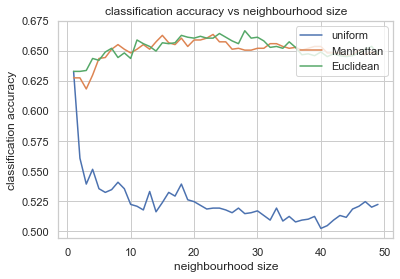

In [122]:
plt.plot(acc_uniform[1:],label="uniform")
plt.plot(acc_man[1:],label="Manhattan")
plt.plot(acc_euc[1:],label="Euclidean")
plt.legend(loc='upper right')
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')
plt.show()

From above plot, we can say that Euclidean with Z-score normalization performs better with high accuracy of 67% at k=27 where as manhattan has slightly less accuracy. In case of uniform weighting as the k increases the accuracy goes on decreases with increasing error. Feature selection is performing better than PCA method.

# Feature extraction using LDA With Normalized data taking Quality As Output Label

In [123]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

sklearn_lda = LDA(n_components = 5)
X_lda = sklearn_lda.fit(final_wine, labels)
LDA_comp = X_lda.transform(final_wine)
LDA_comp.shape

(6497, 5)

In [124]:
LDA_df = pd.DataFrame(LDA_comp,columns=['LDA Comp1','LDA Comp2','LDA Comp3','LDA Comp4','LDA Comp5'])
LDA_df['quality'] = labels
LDA_df.head()

,LDA Comp1,LDA Comp2,LDA Comp3,LDA Comp4,LDA Comp5,quality
0,-0.752078,1.466209,-0.024718,-0.371827,1.626055,6
1,-1.445150,-0.392049,-1.788109,0.248460,0.098989,6
2,0.123015,-0.911451,0.329427,-0.894688,-0.878564,6
3,-0.288961,0.721769,0.798431,-0.349889,0.223399,6
4,-0.288961,0.721769,0.798431,-0.349889,0.223399,6


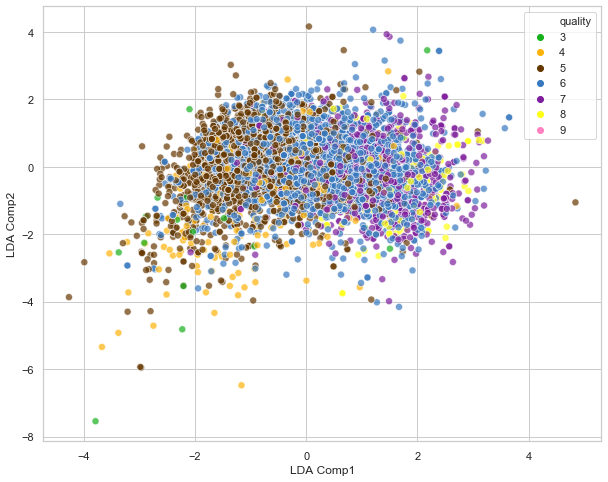

In [125]:
#Plotting LDA1 and LDA2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple", "yellow", "pink"]
sns.scatterplot(ax = ax, x="LDA Comp1", y="LDA Comp2", alpha = 0.7, s = 50,
                hue="quality", data=LDA_df, palette=sns.xkcd_palette(colors))

From above scatter plot we can say that, LDA is some what better when compared with PCA. However, classes were too close and it would be a problem when doing classification but when we compare with PCA it can give better classification accuracy.

In [126]:
#Splitting dataset into train-80% and test-20%
ran = 42
X_train, X_test, Y_train, Y_test = train_test_split(LDA_comp, labels, test_size=0.2, random_state = ran)
print(X_train.shape)
print(X_test.shape)

(5197, 5)
(1300, 5)


# Running The Same KNN Weighting Schemes For LDA

In [127]:
#KNN Classifier using LDA, Quality as output and uniform as weighting 
n_neighborslist = list(range(1,50))
col_names=['uniform']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_uniform=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0])
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_uniform.at[k,col_names[0]] = accscore

acc_uniform.describe()
acc_uniform.head()

,uniform
0,0.000000
1,0.606154
2,0.550000
3,0.546154
4,0.565385


In [128]:
#KNN Classifier using LDA, Quality as output, P=1(manhattan) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_man=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=1)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_man.at[k,col_names[0]] = accscore

acc_man.describe()
acc_man.head()

,distance
0,0.000000
1,0.608462
2,0.608462
3,0.623077
4,0.633846


In [129]:
#KNN Classifier using LDA, Quality as output, P=2(Euclidean) and distance as weighing scheme
n_neighborslist = list(range(1,50))
col_names=['distance']
accarray = np.zeros((len(n_neighborslist),1))

#add multiple plots to same chart, one for each weighting approach
acc_euc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh = KNeighborsClassifier(n_neighbors=k, weights=col_names[0], p=2)
    neigh.fit(X_train, Y_train)
    y_pred = neigh.predict(X_test)
    accscore = accuracy_score(Y_test, y_pred)
    acc_euc.at[k,col_names[0]] = accscore

acc_euc.describe()
acc_euc.head()

,distance
0,0.000000
1,0.606154
2,0.606154
3,0.623846
4,0.646923


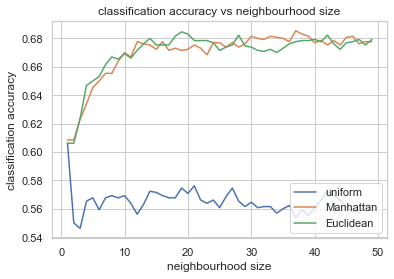

In [130]:

plt.plot(acc_uniform[1:],label="uniform")
plt.plot(acc_man[1:],label="Manhattan")
plt.plot(acc_euc[1:],label="Euclidean")
plt.legend(loc='lower right')
plt.title('classification accuracy vs neighbourhood size')
plt.xlabel('neighbourhood size')
plt.ylabel('classification accuracy')
plt.show()

From above graph, we can say that LDA is performing better in terms of accuracy, confusion matrix. spped of convergence, distance metrics when compared with PCA. Here we are having an accuracy of more than 68% at k=19 for euclidean with noralization. However euclidean and manhattan is having better accuracies as the k value increases but euclidean method is giving highest accuracy in terms of classification. In case of uniform weighting , as the k increases there is is continuous decrease in accuracy which results in high classification error. 


To conclude, When quality as output selected features are giving best results when comparing to PCA, LDA. PCA performs better in case where number of samples per class is less. Whereas LDA works better with large dataset having multiple classes; class separability is an important factor while reducing dimensionality.

# Analysis And Discussion

# 1) K Plots:

# KNN Classifier With Normalized data taking Color As Output Label: 

From above graph, we could see that manhattan with z-score normalization has the highest accuracy at K=7, where as weighting scheme with uniform and euclidean experience a bit less accuracy when compared with manhattan. I have selected best value of K as 7 for manhattan with z-score because it is having high accuracy, confusion matrix and a better speed of convergence of rate when compared with remaining k-values. For weighting scheme as euclidean we got high accuracy at k=3,7,9 and throught the graph as k value goes on increases it results in decreasing the accuracy. For weighting scheme as uniform we got high accuracy at k=5,7,8 and throught the graph as k value goes on increases it results in decreasing the accuracy.

# Performance Testing On Normalized data Using Selected Features taking Color As Output Label:

From above graph after testing the performance using selected features with manhattan with z-score normalization, we can say that model is performing well with highest accuracy of 98.9 at k=4,5,7,8,25. However, as the k values increases it experiences fluctuations in accuracies.

I have performed feature selection for different subset of features, different weighting schemes but none of the features except the above method gave better accuracy.

# Feature extraction using PCA With Normalized data taking Color As Output Label:

From above graph, KNN after fitting the model with PCA experiences almost same accuracy whwn compared with without normalization. We could see that euclidean with z-score normalization has the highest accuracy at K=7,11 where as weighting scheme with uniform and manhattan experience a bit less accuracy when compared with eucliden. I have selected best value of K as 7 for manhattan with z-score because it is having high accuracy, confusion matrix and a better speed of convergence of rate when compared with remaining k-values. For weighting scheme as manhattan we got high accuracy at k=7,13 and throught the graph as k value goes on increases it results in decreasing the accuracy. For weighting scheme as uniform we got high accuracy at k=2 and throught the graph as k value goes on increases it results in decreasing the accuracy.


# Feature extraction using LDA With Normalized data taking Color As Output Label:

From above graph, KNN after fitting the model with LDA experiences a better accuracy when compared with KNN with PCA. We could see that all the three wighting schemes are giving almost same accuracies at same or consecutive values. Euclidean and Manhattan in LDA are giving same accuracies throughout the graph. Feature extraction in LDA is having performed very well when compared with PCA. At K=7 we got higest accuracy in LDA where as in PCA we got less accuracy.

# KNN Classifier With Normalized data taking Quality As Output Label:

From above graph, we could see that manhattan with z-score normalization is having high accuracy with better speed of convergence, confusion matrix of almost 70% at k=33 where as euclidean is sightly less. In uniform weighting scheme, As the k value increases there is a continuous decrease in accuracy of graph. In Manhattan and Euclidean, as the k value increases accuracy will increases and results in less classification error. We know that in KNN, large value of K results in high bias and low variance, underfits the model, smoother decision boundaries. 

# Performance On Normalized data Using Selected Features taking Quality as Output Label:

From above graph, after performing feature selction on euclidean and manhattan with top 4 subset of features we can say that euclidean is performing better when compared with manhattan and uniform. At k=33, we got the accuracy of almost 69% which is better when compared with all the features. We found that four features whch we have selected are performing better than considering all the features. As the K value incrases the accuracy also goes on increasing with decreasing classification error.

# Feature Extraction Using PCA With Normalized data taking Quality As Output Label:

From above plot, we can say that Euclidean with Z-score normalization performs better with high accuracy of 67% at k=27 where as manhattan has slightly less accuracy. In case of uniform weighting as the k increases the accuracy goes on decreases with increasing error. Feature selection is performing better than PCA method.

# Feature extraction using LDA With Normalized data taking Quality As Output Label:

From above graph, we can say that LDA is performing better in terms of accuracy, confusion matrix. spped of convergence, distance metrics when compared with PCA. Here we are having an accuracy of more than 68% at k=19 for euclidean with noralization. However euclidean and manhattan is having better accuracies as the k value increases but euclidean method is giving highest accuracy in terms of classification. In case of uniform weighting , as the k increases there is is continuous decrease in accuracy which results in high classification error.

To conclude, When quality as output selected features are giving best results when comparing to PCA, LDA. PCA performs better in case where number of samples per class is less. Whereas LDA works better with large dataset having multiple classes; class separability is an important factor while reducing dimensionality.

# 2) Features:

When Color as output, From the above two pair plots and kplots, we could see that all features are contributing equally and data was scaled by keeping mean=0 and standard deviation=1. We could see that it is having better feaure separability due to having only 2 classes. While data still looks squished, we notice that the points are now on roughly the same scale for all the features after performing z score normalization.It used to compare raw scores that are taken from different tests especially when the data are at the interval of management. Plot between Total sulfur dioxide vs PH are having better feature separability.

When Quality as output, From the above pair plots and k plots, we can see that due to more number of classes the feature separability is not clear and looking like a mesh. We could see that all features are contributing equally and data was scaled by keeping mean=0 and standard deviation=1. While data still looks squished, we notice that the points are now on roughly the same scale for all the features after performing z score normalization.It used to compare raw scores that are taken from different tests especially when the data are at the interval of management.

Applying standardized data on dimensionality reduction methods like LDA, PCA, FDA, t-sna we can extract the features more efficiently.

# 3) Selected Features:

Yes, I have found subset of features that worked  better  than  all  features for color as output and Quality as output. In case of Quality as output the selected features performs better when compared with LDA and PCA where as incase of color as output LDA and PCA performed better when compared with selected subset of features. When color as output, i have selected total sulfur dioxide, volatile acidity, chlorides and density as top 4 features subset having high feature importance and scores. When Quality as output,  i have selected total sulfur dioxide, volatile acidity, alcohol and density as top 4 features subset having high feature importance and scores. 

# 4) PCA vs LDA:

From above analysis, in both cases where color and quality are output labels I found LDA is performing better when compared to PCA interms of accuracy, speed of convergence, regularization, bias and variance. Normalization is generally not required for LDA because it will give same results with and with out normalization. For PCA, normalization helps to get better accuracy in trms of classification. However, LDA is most suitable method for large datasets where PCA is for small number of samples. 

# 5) Plots For PCA and LDA:

From above scatter plot between PC1 vs PC2, we can say that separability is not clear and we cannot diiferentiate the classes accurately due to overlap. It is having high variance and high bias, high error and less speed of convergence which is not suitable. In order to get better separability we need to use optimization techniques and different dimensionality reduction method like LDA.

From above scatter plot we can say that, LDA is some what better when compared with PCA. However, classes were too close and it would be a problem when doing classification but when we compare with PCA it can give better classification accuracy.

# 2) Linear Dimensionality Reduction

# 2.1 Dataset B

Handwritten digits of 0, 1, 2, 3, and 4 (5 classes). This dataset contains 2066 samples with 784 features corresponding to a 28 x 28 gray-scale(0-255) image of the digit, arranged column-wise. This data is used to illustrate the difference between feature extraction methods. (File: DataB.csv)

# 2.2 Principal Component Analysis (PCA)

# 2.2.1.1 Computing Eigen Vectors and Eigen Values

In [2]:
#Loading the dataset
df = pd.read_csv("DataB.csv")
print(df.info())

#Separating Features and Target
df = df.loc[:, :]

labels = df['gnd']
df.drop(columns = ['gnd'], inplace = True)
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2066 entries, 0 to 2065
Columns: 785 entries, fea.1 to gnd
dtypes: int64(785)
memory usage: 12.4 MB
None
   fea.1  fea.2  fea.3  fea.4  fea.5  fea.6  fea.7  fea.8  fea.9  fea.10  ...  \
0      4      4      3      0      0      4      2      1      4       1  ...   
1      5      1      4      3      1      3      5      1      4       4  ...   
2      1      3      0      3      1      1      0      1      0       2  ...   
3      5      3      2      3      5      2      2      0      4       5  ...   
4      3      5      3      3      0      4      1      1      4       3  ...   

   fea.775  fea.776  fea.777  fea.778  fea.779  fea.780  fea.781  fea.782  \
0        1        1        3        0        4        2        1        1   
1        3        1        1        3        3        1        3        3   
2        4        3        0        2        4        2        2        1   
3        4        5        4        5        1    

# Normalizing data using mean substraction

Subtracting the dataset mean serves to "center" the data. Here we will remove the mean from dataset using below process.

In [3]:
#Normalizaing data using mean substraction
X = df-df.mean()
#Computing Eigen Values and Eigen Vectors
df_cov = np.cov(X.T)
eigenvalue,eigenvector = np.linalg.eig(df_cov)
divide_ = sum(eigenvalue)
#Keeping eigen values in pandas dataframe
eigenvalue = pd.DataFrame(eigenvalue)
eigenvalue

,0
0,467242.206542
1,278894.145514
2,213480.283837
3,205514.153620
4,171638.869230
...,...
779,1.287243
780,1.251753
781,1.362152
782,1.284602


In [4]:
#Keeping eigen vectors in pandas dataframe
eigenvector = pd.DataFrame(eigenvector)
eigenvector

,0,1,2,3,4,5,6,7,8,9,...,774,775,776,777,778,779,780,781,782,783
0,0.000036,-0.000041,-0.000049,-0.000020,-9.016696e-05,-0.000087,0.000083,0.000097,-0.000106,0.000107,...,-0.015719,-0.139105,-0.094846,-0.001614,-0.069203,0.066693,0.039701,0.013929,-0.033252,0.000416
1,0.000019,-0.000026,-0.000010,-0.000064,1.498076e-04,0.000023,0.000084,-0.000042,-0.000112,-0.000097,...,-0.069154,-0.022749,0.098902,0.006070,0.048104,0.114064,0.040956,0.059341,-0.021702,0.105866
2,-0.000012,0.000072,0.000051,-0.000017,2.229577e-05,0.000082,0.000183,-0.000139,-0.000076,0.000029,...,-0.047490,0.004578,-0.088613,-0.005828,0.068161,-0.083919,-0.019422,-0.037693,-0.054974,-0.049993
3,-0.000056,0.000016,-0.000001,0.000023,-1.913782e-05,0.000039,-0.000006,0.000054,0.000158,-0.000270,...,-0.085464,0.080707,0.032530,0.073739,0.011239,0.051723,-0.075735,-0.022297,-0.037626,0.030932
4,0.000005,-0.000022,-0.000104,-0.000121,2.237289e-05,-0.000019,0.000135,-0.000108,-0.000130,0.000065,...,0.076879,-0.000295,-0.010097,-0.013497,-0.067394,0.006345,0.068152,-0.092717,-0.065829,0.071852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779,0.000020,0.000019,0.000087,-0.000030,1.553093e-04,-0.000123,-0.000018,0.000047,-0.000011,-0.000012,...,-0.041370,-0.016923,0.084305,0.027528,0.027213,0.017708,0.033319,-0.006430,-0.073967,0.043895
780,-0.000048,-0.000122,0.000133,-0.000010,-3.489002e-05,0.000229,-0.000089,0.000055,-0.000312,-0.000058,...,0.023068,-0.014737,-0.055183,0.027499,0.035815,0.012883,0.051760,-0.039186,0.000415,0.027737
781,0.000011,-0.000003,-0.000045,0.000004,-8.389430e-07,0.000153,0.000190,0.000072,-0.000002,0.000166,...,0.055676,0.030062,-0.084006,0.128052,-0.078480,0.069092,0.142585,0.028152,0.009434,0.027183
782,-0.000030,-0.000096,0.000060,0.000072,-8.509445e-05,-0.000086,-0.000025,-0.000067,-0.000032,-0.000121,...,-0.098985,-0.040021,-0.027999,-0.017093,-0.104832,-0.055206,-0.065308,-0.000084,0.075360,-0.124044


Above are the eigenvalues and eigenvectors of the dataset. The eigenvalues represent the variance that each component contributes. Eigen vectors are the principal components. To choose the cut-off eigenvalue we need to calculate the cumulative eigenvalue contribution to the variance as a percentage.

Text(0, 0.5, 'Eigenvalue')

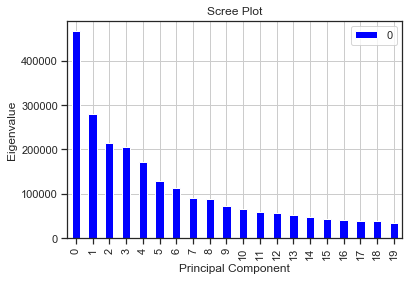

In [5]:
#Plotting Eigen value on y-axis and Principal components on x-axis.
eigenvalue.head(20).plot(kind = 'bar', color='blue')
plt.grid()
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')

In [6]:
#calculating the cumulative eigenvalue contribution to the variance as a percentage.
result = eigenvalue.divide(divide_)
result = result.multiply(100)
accumulative = int(0)
#print("\t\t" + "Eigenvalue" + "\t\t" + "Accumulative")
for index, value in result.iterrows():
    accumulative = accumulative + value.iloc[0]
    #print("\t",index,"\t",value.iloc[0],"\t",accumulative)

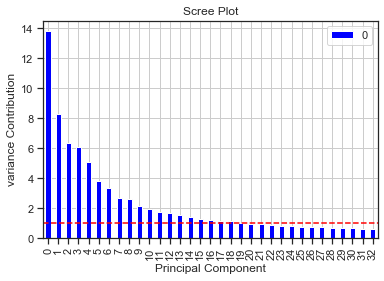

In [7]:
#Plotting variance on y-axis and Principal components on x-axis.
result.head(33).plot(kind = 'bar', color='blue')
plt.axhline(y=1, color='red', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('variance Contribution')
plt.grid()

From the above graphs and cumulative eigenvalue contribution to the variance, we can say that till 19th component the contribution is more than 1% which is good and after crossing the 19th component it experiences less than 1% so the gain from every added dimension is minimal and it continuous same till it reached 784th component.So we can take 19th component as good cutoff. We can say that the first 7 components contribute approximately 50% of the varaince and the 21st component correspond to 70%. Finally at the 784th component it achieved a contribution of 100%.

# 2.2.1.2 Using subplot in python matplotlib, plot the scatter plot of the projected data with the top 20 eigenvalues

In [9]:
#Feature scaling by subtracting mean from each column:
scaled_data = df-df.mean()
print(scaled_data.head())

# Creating Matrix
X = np.asmatrix(scaled_data)

#finding the covariance of the matrix
covar_matrix = np.cov(X.T)

#finding the eigen values and eigen vectors
#values, vectors = eigh(covar_matrix,eigvals=(764,783))
values, vectors = np.linalg.eig(covar_matrix)
print(values.shape)
print(vectors.shape)

      fea.1     fea.2     fea.3     fea.4     fea.5     fea.6     fea.7  \
0  1.491772  1.452565  0.539206 -2.496612 -2.472894  1.509681 -0.486447   
1  2.491772 -1.547435  1.539206  0.503388 -1.472894  0.509681  2.513553   
2 -1.508228  0.452565 -2.460794  0.503388 -1.472894 -1.490319 -2.486447   
3  2.491772  0.452565 -0.460794  0.503388  2.527106 -0.490319 -0.486447   
4  0.491772  2.452565  0.539206  0.503388 -2.472894  1.509681 -1.486447   

      fea.8     fea.9    fea.10  ...   fea.775   fea.776   fea.777   fea.778  \
0 -1.512585  1.477735 -1.482091  ... -1.517909 -1.469506  0.477251 -2.486447   
1 -1.512585  1.477735  1.517909  ...  0.482091 -1.469506 -1.522749  0.513553   
2 -1.512585 -2.522265 -0.482091  ...  1.482091  0.530494 -2.522749 -0.486447   
3 -2.512585  1.477735  2.517909  ...  1.482091  2.530494  1.477251  2.513553   
4 -1.512585  1.477735  0.517909  ... -1.517909 -1.469506  0.477251  0.513553   

    fea.779   fea.780   fea.781  fea.782  fea.783   fea.784  
0  1.5

In [10]:
#Taking top 20 eigen  vectors corresponding with eigen values
V = np.asmatrix(vectors[:,:20])
# projecting the original data sample on the plane 
new_coordinates = np.dot(V.T, X.T)
new_coordinates.T.shape

(2066, 20)

In [11]:
df_reduced12 = pd.DataFrame(new_coordinates.T)
df_reduced12.columns = ['Projection on PC1','Projection on PC2','Projection on PC3','Projection on PC4','Projection on PC5','Projection on PC6','Projection on PC7','Projection on PC8','Projection on PC9','Projection on PC10','Projection on PC11','Projection on PC12','Projection on PC13','Projection on PC14','Projection on PC15','Projection on PC16','Projection on PC17','Projection on PC18','Projection on PC19','Projection on PC20']
df_reduced12['gnd'] = labels
print(df_reduced12.head())
df_reduced12.shape

   Projection on PC1  Projection on PC2  Projection on PC3  Projection on PC4  \
0        1069.166304         513.973184         139.243261         878.387704   
1        1099.176077         570.842223          67.311779         839.381070   
2         673.201385         167.377150        -480.988638          83.823068   
3        1010.903339         187.044145        -506.352247         426.446929   
4        1692.970822         633.369398         521.943052         367.356716   

   Projection on PC5  Projection on PC6  Projection on PC7  Projection on PC8  \
0        -387.873484        -335.304982        -189.857033         312.580046   
1        -345.573249        -530.737220        -516.056930          73.720660   
2       -1036.833666          76.531663        -184.553283         311.406005   
3        -901.897549          73.661148        -316.674873         617.909186   
4           6.919257        -601.851221        -515.146878        -325.773643   

   Projection on PC9  Proj

(2066, 21)

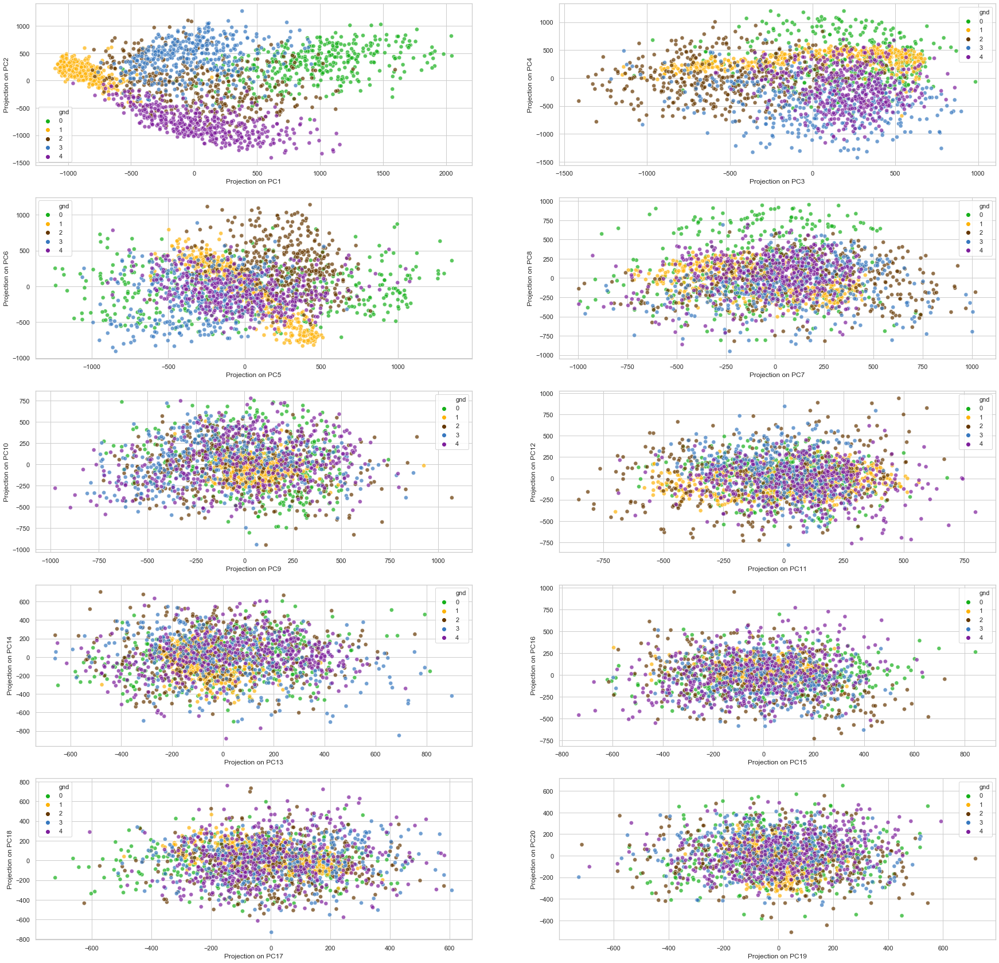

In [12]:
#Plotting PC1 and PC2
sns.set_style("whitegrid")
fig,axes = plt.subplots(nrows=5,ncols=2,figsize=(30,30))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = axes[0][0], x="Projection on PC1", y="Projection on PC2", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[0][1], x="Projection on PC3", y="Projection on PC4", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[1][0], x="Projection on PC5", y="Projection on PC6", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[1][1], x="Projection on PC7", y="Projection on PC8", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[2][0], x="Projection on PC9", y="Projection on PC10", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[2][1], x="Projection on PC11", y="Projection on PC12", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[3][0], x="Projection on PC13", y="Projection on PC14", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[3][1], x="Projection on PC15", y="Projection on PC16", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[4][0], x="Projection on PC17", y="Projection on PC18", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[4][1], x="Projection on PC19", y="Projection on PC20", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))

From the above subplots, we can see that projection on PC1 and proction on PC2 has some what clear and better cutoff dimensions when compared to remaining subplots. Separation of classes can be done easily in pc1 vs pc2 and also it has better variance and bias. As the principal components goes on increasing more diificult to separate the classes such that model can't fit properly and results in less accuracy. If we see PC19 vs PC20 we can't separate the classes due to overlap of classes.

# 2.2.1.3 . Plot two 2-dimensional representations of the data points based on the rst vs second principal components and 5th vs 6th displaying the data points of each class with a different color (you will need to project the data)

In [13]:
#Selecting first 2 principal Components
V = np.asmatrix(vectors[:,:2])

#Projecting original data points on to 2 Principal components
Y = np.dot(V.T, X.T)
print(Y.shape)
Y.T.shape

(2, 2066)


(2066, 2)

In [14]:
df_reduced12 = pd.DataFrame(Y.T)
df_reduced12.columns = ['Projection on PC1','Projection on PC2']
df_reduced12['gnd'] = labels
print(df_reduced12.head())
df_reduced12.shape

   Projection on PC1  Projection on PC2  gnd
0        1069.166304         513.973184    0
1        1099.176077         570.842223    0
2         673.201385         167.377150    0
3        1010.903339         187.044145    0
4        1692.970822         633.369398    0


(2066, 3)

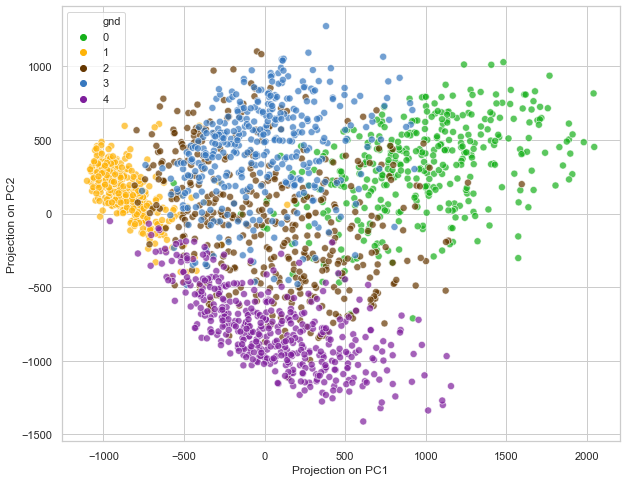

In [15]:
#Plotting PC1 and PC2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = ax, x="Projection on PC1", y="Projection on PC2", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced12, palette=sns.xkcd_palette(colors))

From the above graph between PC1 vs PC2, we can say that there is some what clear distinction of various classes as highlighted by different colors. It is having better bias and variance.

# Repeat step 2 for the 5th and 6st components.

In [16]:
#Selecting 5th and 6th Principal components
V = np.asmatrix(vectors[:,4:6])
#Projecting original data points on to 2 Principal components
Y = np.dot(V.T, X.T)
Y.T.shape

(2066, 2)

In [17]:
df_reduced56 = pd.DataFrame(Y.T)
df_reduced56.columns = ['Projection on PC5','Projection on PC6']
df_reduced56['gnd'] = labels
print(df_reduced56.head())
df_reduced56.shape

   Projection on PC5  Projection on PC6  gnd
0        -387.873484        -335.304982    0
1        -345.573249        -530.737220    0
2       -1036.833666          76.531663    0
3        -901.897549          73.661148    0
4           6.919257        -601.851221    0


(2066, 3)

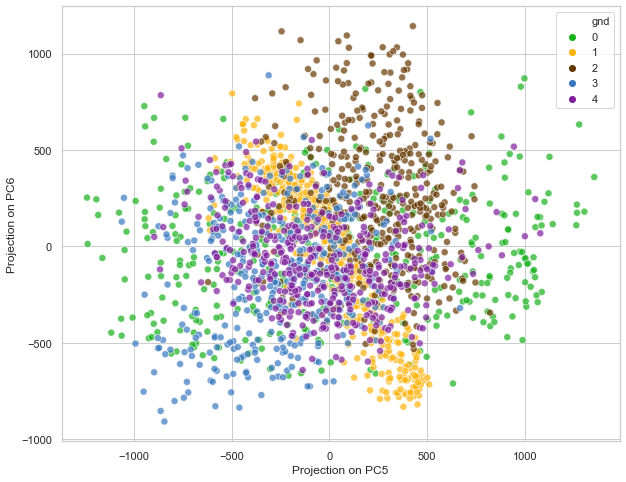

In [18]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = ax, x="Projection on PC5", y="Projection on PC6", alpha = 0.7, s = 50,
                hue="gnd", data=df_reduced56, palette=sns.xkcd_palette(colors))

From above graph between pc1 vs PC2 and PC5 vs PC6, we can say that there is no clear distinction of various classes. Separability of classes is not possible and fitting the model also can't give beeter results. The classes overlap with each other as highlighted by different colors. This is because we are taking Principal Component 5 & 6 those doesn’t explain much variation in data as explained by the PC1 and PC2.

# 2.2.1.4 Implement(1) PCA and (2) dual PCA with singular value decomposi-tion. [Note: No libraries for PCA, dual PCA or SVD should be usedfor this question. In PCA and dual PCA, only left and right matrices ofsingular vector are used. So, use the relationship of SVD and eigenvaluedecomposition to nd the left and right singular vectors and the singularvalues. And then, use them in PCA and dual PCA.] Save the time ofcomputations and compare the times.

In [31]:
#Computational time(Start)
start = timeit.default_timer()

In [32]:
#Loading the dataset
df = pd.read_csv("DataB.csv")
print(df.info())

#Separating Features and Target
df = df.loc[:, :]

labels = df['gnd']
df.drop(columns = ['gnd'], inplace = True)
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2066 entries, 0 to 2065
Columns: 785 entries, fea.1 to gnd
dtypes: int64(785)
memory usage: 12.4 MB
None
   fea.1  fea.2  fea.3  fea.4  fea.5  fea.6  fea.7  fea.8  fea.9  fea.10  ...  \
0      4      4      3      0      0      4      2      1      4       1  ...   
1      5      1      4      3      1      3      5      1      4       4  ...   
2      1      3      0      3      1      1      0      1      0       2  ...   
3      5      3      2      3      5      2      2      0      4       5  ...   
4      3      5      3      3      0      4      1      1      4       3  ...   

   fea.775  fea.776  fea.777  fea.778  fea.779  fea.780  fea.781  fea.782  \
0        1        1        3        0        4        2        1        1   
1        3        1        1        3        3        1        3        3   
2        4        3        0        2        4        2        2        1   
3        4        5        4        5        1    

Singular value decomposition takes a rectangular matrix of gene expression data (defined as A, where A is a n x p matrix) in which the n rows represents the genes, and the p columns represents the experimental conditions. The SVD theorem states:

Anxp= Unxn Snxp VTpxp

Where

UTU = Inxn

VTV = Ipxp  (i.e. U and V are orthogonal)

Where the columns of U are the left singular vectors (gene coefficient vectors); S (the same dimensions as A) has singular values and is diagonal (mode amplitudes); and VT has rows that are the right singular vectors (expression level vectors). The SVD represents an expansion of the original data in a coordinate system where the covariance matrix is diagonal.

S is the diagonal matrix of square root of eigen values of either A.AT or AT. A

A=UD(V)T

The eigen vector of A.AT is the U vector

The eigen vector of AT. A is the V vector 

D is the Square root of eigen values of either A.AT or AT.A

In [33]:
#PCA using SVD
# Calulating U vector(Left Singular Vector)
W = df-df.mean()
n=W.T
n.shape
covar_matrix =np.dot(W,n)
eigenvalues_U, eigenvectors_U = np.linalg.eig(covar_matrix)
print(eigenvectors_U.shape)
eigenvectors_U.real

(2066, 2066)


array([[ 3.44202644e-02,  2.14171034e-02, -6.63185880e-03, ...,
         3.91857595e-03,  3.91857595e-03,  3.49640531e-03],
       [ 3.53863857e-02,  2.37868187e-02, -3.20591611e-03, ...,
         2.33700061e-04,  2.33700061e-04, -2.53773784e-05],
       [ 2.16727459e-02,  6.97455400e-03,  2.29084605e-02, ...,
        -6.66475830e-04, -6.66475830e-04, -5.17679582e-04],
       ...,
       [ 4.21805115e-03, -3.61112468e-02, -1.89492957e-02, ...,
         2.79744104e-02,  2.79744104e-02,  3.73242423e-02],
       [-8.43925813e-03, -2.72010301e-02, -1.65555753e-02, ...,
        -1.90207195e-02, -1.90207195e-02, -1.42134834e-02],
       [-1.54815940e-02, -1.80322727e-02,  8.63208654e-04, ...,
        -3.92156847e-02, -3.92156847e-02, -4.69370940e-02]])

In [34]:
#Calculating V.T vector(right singular matrix)
n=W.T
n.shape
covar_matrix =np.dot(n,W)
eigenvalues_V, eigenvectors_V = np.linalg.eig(covar_matrix)
print(eigenvectors_V.shape)
eigenvectors_V=eigenvectors_V.T
eigenvectors_V=(0-eigenvectors_V)
eigenvectors_V.real

(784, 784)


array([[-3.61067274e-05, -1.88873948e-05,  1.22686065e-05, ...,
        -1.13194055e-05,  3.02459245e-05, -8.85748448e-05],
       [ 4.10014533e-05,  2.61454773e-05, -7.18534632e-05, ...,
         2.51662698e-06,  9.63962699e-05,  1.03832848e-04],
       [ 4.90102245e-05,  1.02341601e-05, -5.14355609e-05, ...,
         4.48272573e-05, -5.97317182e-05,  1.40085757e-05],
       ...,
       [-4.15737478e-04, -1.05865531e-01,  4.99932146e-02, ...,
        -2.71830211e-02,  1.24043606e-01,  6.37797732e-03],
       [ 1.39292402e-02,  5.93407558e-02, -3.76925825e-02, ...,
         2.81520669e-02, -8.36435089e-05,  8.44500493e-02],
       [-1.61411609e-03,  6.06965282e-03, -5.82812542e-03, ...,
         1.28052026e-01, -1.70930727e-02, -4.93904538e-03]])

Arranging eigen values in ascecnding order and the diagonal values are the square root of the eigen values thus to match the shape of the matrix we define(2066,784) matrix and fit the eigenvalues.

In [35]:
#Arranging in Ascending order
eigenvalues_U.sort()
eigenvalues_data=eigenvalues_U[::-1]
#Arranging eigenvalues in a diagonal matrix
diag_values = np.sqrt(eigenvalues_data)
diag_matrix_D = np.zeros((2066,784), int)
np.fill_diagonal(diag_matrix_D,diag_values)
print(diag_matrix_D.shape)
diag_matrix_D

(2066, 784)


array([[31062,     0,     0, ...,     0,     0,     0],
       [    0, 23998,     0, ...,     0,     0,     0],
       [    0,     0, 20996, ...,     0,     0,     0],
       ...,
       [    0,     0,     0, ...,     0,     0,     0],
       [    0,     0,     0, ...,     0,     0,     0],
       [    0,     0,     0, ...,     0,     0,     0]])

In [36]:
#Composition of SVD
#A=U.D.Vt
result_matrix=np.matmul(eigenvectors_U,diag_matrix_D)
result_matrix_final=np.matmul(result_matrix,eigenvectors_V)
result_matrix_final.real

array([[ 2.88094922,  1.21419054, -0.31846015, ...,  0.06553855,
        -2.03448058,  0.04693168],
       [-0.55389071,  2.66288338,  1.91892673, ...,  1.64219979,
        -1.94471947,  0.5880493 ],
       [ 1.52947864, -0.27474231,  1.33065654, ..., -0.91360732,
         0.80859642,  0.83330587],
       ...,
       [ 1.94539394,  0.42703857,  1.68727334, ...,  0.45784394,
         1.48873655,  1.02487319],
       [ 0.66503432,  2.69740426,  0.41628731, ..., -2.50470233,
        -1.28385341, -1.10696657],
       [ 0.01871933, -1.91972714,  0.75890612, ..., -1.70362589,
         0.56392072, -1.10904574]])

Projecting the data to find principal component Analysis and adding gnd label to the final output data.

In [37]:
#Composition of PCA
#projecting data on low dimensional space(Y=UT.A)
pca_output=np.matmul(eigenvectors_U.T,result_matrix_final)
pca_output.real
pca_output_dataframe=pd.DataFrame(pca_output.real)
pca_output_dataframe['gnd']=labels
pca_output_dataframe.head()

,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,gnd
0,-1.121547,-0.586680,0.381087,1.728309,-0.154561,-2.578872,0.662126,1.419686,2.172682,0.904405,...,0.475408,-0.984933,1.433693,-2.480199,-0.633094,1.505785,-0.351603,0.939499,-2.751312,0
1,0.983953,0.627439,-1.724339,-0.393361,0.535842,-0.223934,-1.687043,1.740749,-0.026779,-1.219986,...,0.374698,2.217399,0.698490,0.931247,-0.444402,2.936190,0.060394,2.313318,2.491781,0
2,1.029019,0.214876,-1.079941,0.026497,2.175279,0.555561,-0.196199,-1.237639,-0.235057,-0.074726,...,-3.407541,0.785506,-2.331588,-2.145007,-1.823041,-2.788522,0.941193,-1.254127,0.294124,0
3,0.422009,1.308285,0.345675,-0.473323,2.495985,-1.079937,1.319455,-1.544850,0.330454,2.128984,...,0.678251,-1.434888,-2.762464,0.206537,0.617597,0.200959,-0.081559,-1.476314,0.390026,0
4,1.697483,-2.820278,-0.419740,0.360289,-0.421192,-2.860766,-2.622647,-1.792316,0.256116,-0.545880,...,-0.454925,-0.209081,0.365545,-1.698044,-2.923853,0.656839,0.015794,1.601988,-0.920520,0


In [38]:
stop = timeit.default_timer()
execution_time_pca = stop - start
print('time taken to execute PCA in seconds:', execution_time_pca)

time taken to execute PCA in seconds: 14.988973118999866


Thus above is the time taken to compute PCA as we are computing U vector which is right singular vector which has large amount of data(2066*2066) dimensions and V vector has less dimensions when compared to U vector.

In [39]:
start = timeit.default_timer()

Dual PCA
• A=UDV.T as V.T is orthonormal vector.

• AV=UD.

• AV(D)-1= U.

• Projecting data on low dimensional space (Y=UT.A).

• Y=D.VT.

In [40]:
#Computing Dual PCA
dualpca_output=np.matmul(diag_matrix_D,eigenvectors_V.T)
dualpca_output

array([[-1.12154717e+00,  1.27358714e+00,  1.52235559e+00, ...,
        -1.29136376e+01,  4.32670060e+02, -5.01376740e+01],
       [-4.53259701e-01,  6.27439163e-01,  2.45599374e-01, ...,
        -2.54056100e+03,  1.42405946e+03,  1.45659528e+02],
       [ 2.57591661e-01, -1.50863531e+00, -1.07994104e+00, ...,
         1.04965753e+03, -7.91393461e+02, -1.22367321e+02],
       ...,
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [41]:
stop = timeit.default_timer()
execution_time_dualpca = stop - start
print('time taken to execute  Dual PCA in seconds:', execution_time_dualpca)

time taken to execute  Dual PCA in seconds: 0.2777170080000815


Above is the time taken to compute Dual PCA. When compared to PCA, dual PCA has less Computational time and as we are not computing U vector we are computing V vector and deriving the U vector from V vector.

# 2.2.2 Theoretical Question

# Prove that PCA is the best linear method for reconstruction (with orthonormal bases

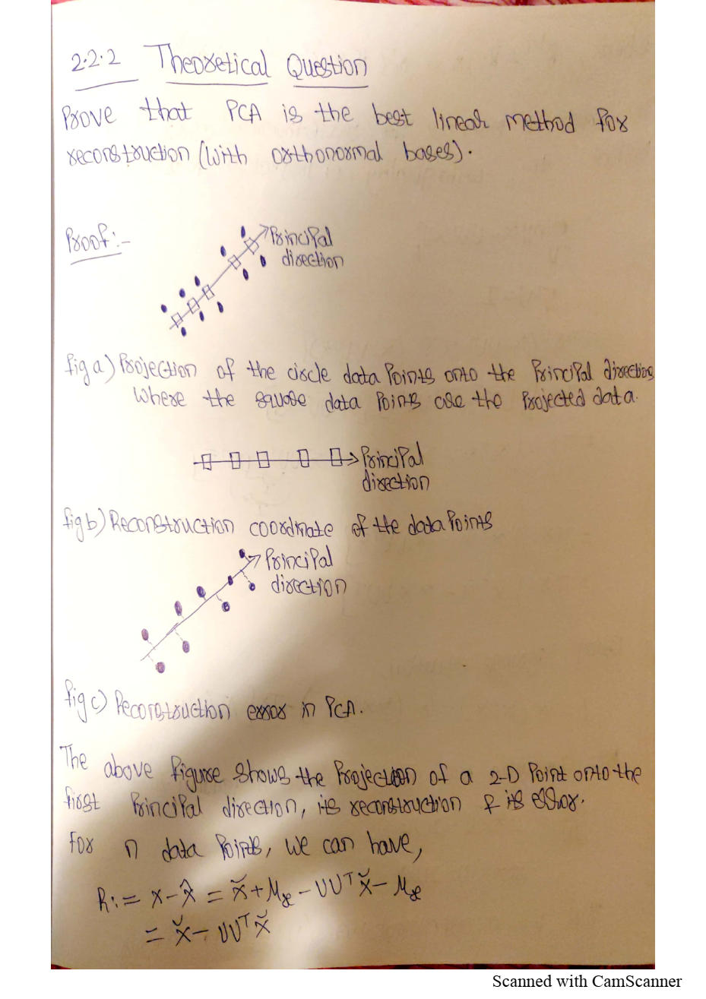

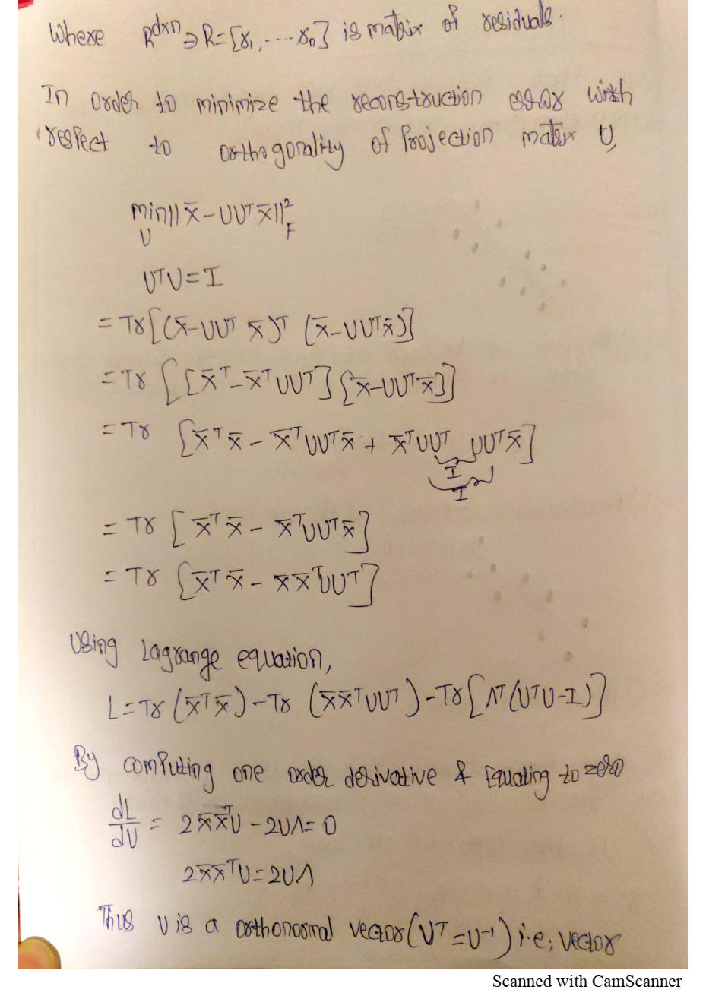

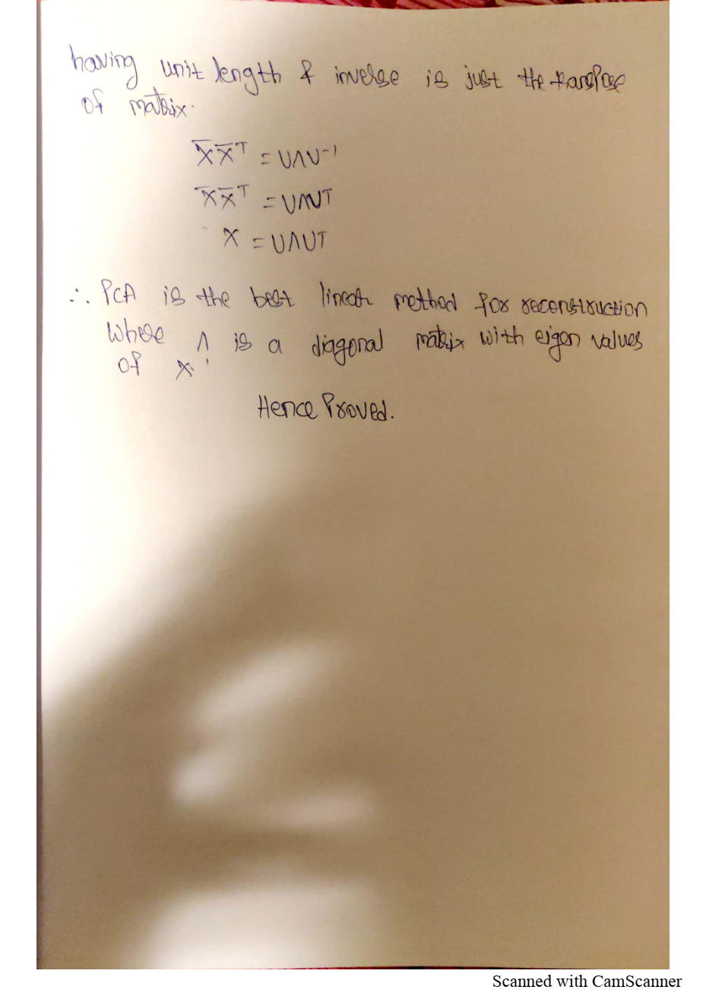

In [42]:
from IPython.display import Image
from IPython.display import display
l = Image(filename='Image1.jpg')
q = Image(filename='Image2.jpg')
p = Image(filename='Image3.jpg')
display(l,q,p)

# 2.3 Fisher Discriminant Analysis (FDA) Or Linear Discriminant Analysis(LDA)

# 2.3.1 As the class labels are already known, you can use the FDA or LDA to reduce the dimensionality. Using any implementation of FDA or LDAyou wish, and subplot in python matplotlib, plot the scatter plot of theprojected data with the top 20 eigenvalue

# I am using LDA to reduce the dimensionality.

In [43]:
#Applying LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
lda = LDA(n_components=4)
lda.fit(df, labels)
LDA_comp = lda.transform(df)
LDA_comp.shape

(2066, 4)

In [44]:
#Combining output label
LDA_reduceddf = pd.DataFrame(LDA_comp,columns=['LDA Comp1','LDA Comp2','LDA Comp3','LDA Comp4'])
LDA_reduceddf['gnd'] = labels
LDA_reduceddf.head()

,LDA Comp1,LDA Comp2,LDA Comp3,LDA Comp4,gnd
0,-5.277233,-2.052912,3.473823,-1.613518,0
1,-5.913727,-1.953482,3.665304,0.189606,0
2,-4.154543,-0.868888,1.172538,0.746605,0
3,-6.728769,-2.568941,4.442847,-0.640440,0
4,-6.977105,-2.125944,2.281978,-0.505802,0


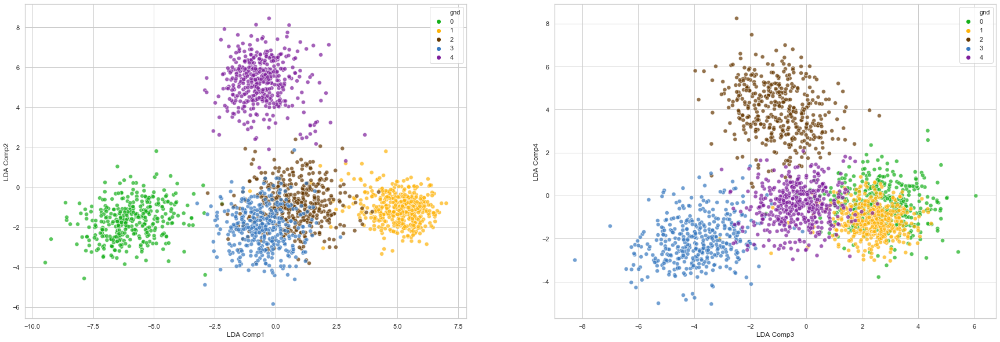

In [45]:
#Plotting LDA1 and LDA2
sns.set_style("whitegrid")
fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(30,10))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = axes[0], x="LDA Comp1", y="LDA Comp2", alpha = 0.7, s = 50,
                hue="gnd", data=LDA_reduceddf, palette=sns.xkcd_palette(colors))
sns.scatterplot(ax = axes[1], x="LDA Comp3", y="LDA Comp4", alpha = 0.7, s = 50,
                hue="gnd", data=LDA_reduceddf, palette=sns.xkcd_palette(colors))

# Comparing the results of LDA with results of PCA

From the above LDA plot, we can see that different classes clearly without significant overlap between classes. Separability of classes is easily possible. The above LDA model will fit better than PCA and gives better accuracies interms of classification. On comparing LDA Components 1 & 2 with PCA 1 & 2, we can clearly observe that the LDA is seperating classes much better that PCA. This is beacause, PCA doesn't consider classes while reducing the dimensions but LDA is supervised technique that considers classes and tries to minimize distance between data points of same class and maximize the difference between each classes.

# 2.3.2 Theoretical Question

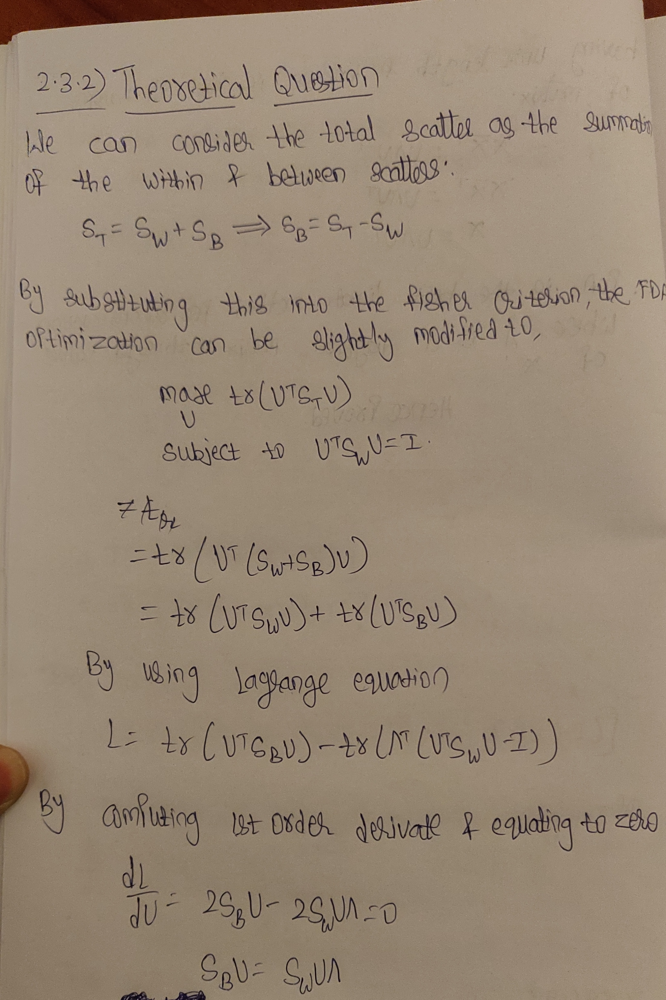

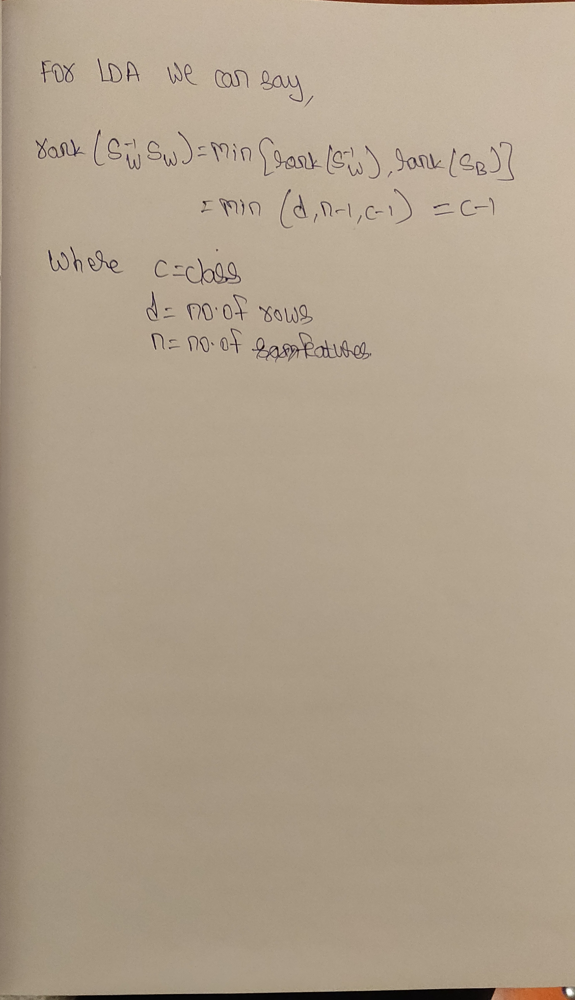

In [46]:
from IPython.display import Image
from IPython.display import display
a = Image(filename='Image4.jpg')
b = Image(filename='Image5.jpg')
display(a,b)

From the above analysis we can say that rank of matrix ((Sw)-1.(Sb)) is C-1. It depends on number of classes and where as for PCA the rank of matrix depends on the number of rows and thus increasing computational time.

LDA has best performance in handling large datasets, accuracy,feature extraction, regularization, spped of convergence, metrics when compared with PCA. PCA will work better for smaller data.

Overall, comparing from above analysis the theoritical question as rank of C-1.

# 3) Non Linear Dimensionality Reduction

# 3.1) Dataset B

Handwritten digits of 0, 1, 2, 3, and 4 (5 classes). This dataset contains 2066 samples with 784 features corresponding to a 28 x 28 gray-scale(0-255) image of the digit, arranged column-wise. This data is used to illustrate the difference between feature extraction methods. (File: DataB.csv)

In [47]:
#Loading the dataset
df = pd.read_csv("DataB.csv")
print(df.info())

#Separating Features and Target
df = df.loc[:, :]
print(df.head())

labels = df['gnd']
df.drop(columns = ['gnd'], inplace = True)
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2066 entries, 0 to 2065
Columns: 785 entries, fea.1 to gnd
dtypes: int64(785)
memory usage: 12.4 MB
None
   fea.1  fea.2  fea.3  fea.4  fea.5  fea.6  fea.7  fea.8  fea.9  fea.10  ...  \
0      4      4      3      0      0      4      2      1      4       1  ...   
1      5      1      4      3      1      3      5      1      4       4  ...   
2      1      3      0      3      1      1      0      1      0       2  ...   
3      5      3      2      3      5      2      2      0      4       5  ...   
4      3      5      3      3      0      4      1      1      4       3  ...   

   fea.776  fea.777  fea.778  fea.779  fea.780  fea.781  fea.782  fea.783  \
0        1        3        0        4        2        1        1        4   
1        1        1        3        3        1        3        3        5   
2        3        0        2        4        2        2        1        2   
3        5        4        5        1        4    

# Manifold Learning

Manifold learning is an approach to non-linear dimensionality reduction. High-dimensional datasets can be very difficult to visualize. While data in two or three dimensions can be plotted to show the essential structure of the data. Dimensionality reduction is done by taking a random projection of the data.

Some of the dimensionality reduction methods are Isomap, Kernal PCA, T-SNE, LLE, Laplacian Eigenmap are discussed below.

# ISOMAP

Isomap is also called as Isometric mapping. It can be viewed as an extension of Multi-dimensional Scaling (MDS) or Kernel PCA. Isomap seeks a lower-dimensional embedding which maintains geodesic distances between all points.

In [48]:
from sklearn.manifold import Isomap
#Performing Isomap for n_components=2(Projectiong data)
embedding = Isomap(n_components=2)
print(embedding)
X_isomap = embedding.fit_transform(df)
X_isomap.shape

Isomap(eigen_solver='auto', max_iter=None, metric='minkowski',
       metric_params=None, n_components=2, n_jobs=None, n_neighbors=5,
       neighbors_algorithm='auto', p=2, path_method='auto', tol=0)


(2066, 2)

In [49]:
#Fitting of data in to pandas dataframe
df_isomap = pd.DataFrame(X_isomap)
df_isomap.columns = ['Isomap Component 1', 'Isomap Component 2']
df_isomap.head()

,Isomap Component 1,Isomap Component 2
0,8706.049952,-344.127405
1,8858.821154,-333.866129
2,3954.252089,-926.795027
3,5791.867059,-643.647584
4,10700.083472,281.608819


In [50]:
#Joining with output label
df_isomap['gnd'] = labels
print(df_isomap.head())

   Isomap Component 1  Isomap Component 2  gnd
0         8706.049952         -344.127405    0
1         8858.821154         -333.866129    0
2         3954.252089         -926.795027    0
3         5791.867059         -643.647584    0
4        10700.083472          281.608819    0


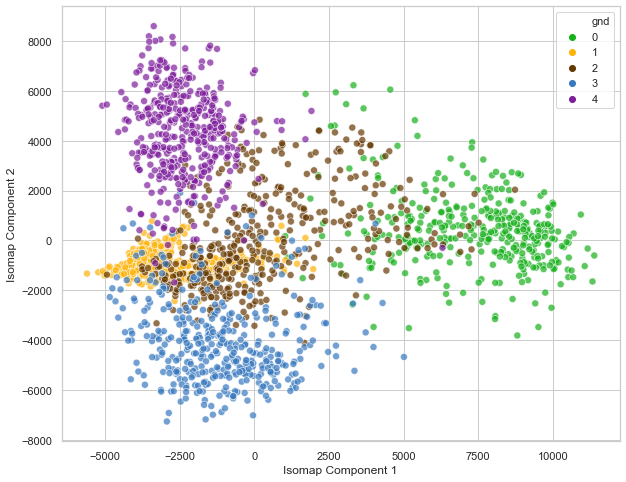

In [51]:
#Plotting ISOMAP1 and ISOMAP2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = ax, x="Isomap Component 1", y="Isomap Component 2", alpha = 0.7, s = 50,
                hue="gnd", data=df_isomap, palette=sns.xkcd_palette(colors))

From the above graph of Isomap component 1 vs Isomap component 2, we can observe the different classes somewhat clearly when compared to kernel PCA, Laplacian eigenmap, LLE but not more clear than T-SNE. Although there is somewhat overlappig of classes, We can separate classes 0,3,4. But when coming to classes 1,2 we can see that they are clearly overlapped and separability is not possible. Due to this we may not expect the better accuracy, performance, confusion matrix.

We need to consider different tradeoffs like smoothness, angles, rotations, distance between points, dimensionality, curvature, number of components connected to select which method is best suitable for the dataset.

The component 1 (x axis) classes in left hand side of the graphs are tilted to left and the gradually rotating towards right as we move right to the graph. We can say that the component 1 is capturing angle or rotation feature.So apparantly, we can say that component 1 is capturing angle and component 2 is capturing curvyness at the bottom.

# KERNEL PCA

Kernel PCA is an enhanced PCA method that incorporates a kernel function to find principal components in different high-dimensional space, thereby facilitating solution of non-linear problems. Kernel PCA finds new directions based on kernel matrix.

In [52]:
from sklearn.decomposition import KernelPCA
#Projecting data into 2-D 
transformer = KernelPCA(n_components=2, kernel='rbf', random_state=42)
print(transformer)
X_transformed = transformer.fit_transform(df)
X_transformed.shape

KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
          fit_inverse_transform=False, gamma=None, kernel='rbf',
          kernel_params=None, max_iter=None, n_components=2, n_jobs=None,
          random_state=42, remove_zero_eig=False, tol=0)


(2066, 2)

In [53]:
#Taking data into dataframe
df_ker = pd.DataFrame(X_transformed)
df_ker.columns = ['Kernel PCA Component 1', 'Kernel PCA Component 2']
df_ker.head()

,Kernel PCA Component 1,Kernel PCA Component 2
0,-0.004060,0.019425
1,-0.040691,0.006126
2,-0.048527,-0.007388
3,0.006535,-0.025747
4,0.004742,0.005190


In [54]:
#Joining output with principal coomponents
df_ker['gnd'] = labels
print(df_ker.head())

   Kernel PCA Component 1  Kernel PCA Component 2  gnd
0               -0.004060                0.019425    0
1               -0.040691                0.006126    0
2               -0.048527               -0.007388    0
3                0.006535               -0.025747    0
4                0.004742                0.005190    0


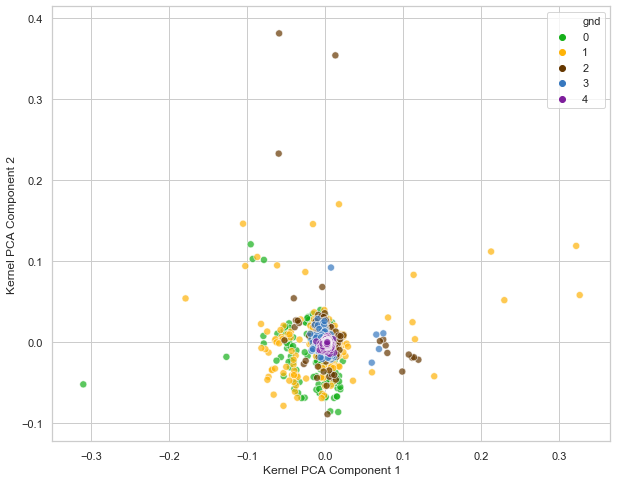

In [56]:
# Plotting Kernel PCA 1 and Kernel PCA 2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = ax, x="Kernel PCA Component 1", y="Kernel PCA Component 2", alpha = 0.7, s = 50,
                hue="gnd", data=df_ker, palette=sns.xkcd_palette(colors))

From the above graph of Principal component 1 vs Principal component 2, we can observe that it is having high bias and high variance. We cannot separate the classes due to overlapping. If we increase the number of components also we can't able to separate the claases. The classes are distributed unevenly. Due to this we may not expect the better accuracy, performance, confusion matrix, smoothness. The angle of rotation is towards bottom i.e; x-axis.

# LLE

Locally linear embedding (LLE) seeks a lower-dimensional projection of the data which preserves distances within local neighborhoods. It can be thought of as a series of local Principal Component Analyses which are globally compared to find the best non-linear embedding.

In [57]:
from sklearn.manifold import LocallyLinearEmbedding
#Projecting data into 2-D
embedding = LocallyLinearEmbedding(n_components=2, random_state=42, n_neighbors=7)
print(embedding)
X_lle = embedding.fit_transform(df)
X_lle.shape

LocallyLinearEmbedding(eigen_solver='auto', hessian_tol=0.0001, max_iter=100,
                       method='standard', modified_tol=1e-12, n_components=2,
                       n_jobs=None, n_neighbors=7, neighbors_algorithm='auto',
                       random_state=42, reg=0.001, tol=1e-06)


(2066, 2)

In [58]:
#Taking data into dataframe
df_lle = pd.DataFrame(X_lle)
df_lle.columns = ['LLE Component 1', 'LLE Component 2']
df_lle.head()

,LLE Component 1,LLE Component 2
0,-0.044359,0.017985
1,-0.044312,0.018089
2,-0.035822,0.012198
3,-0.040323,0.015104
4,-0.044932,0.018578


In [59]:
#Joining output label
df_lle['gnd'] = labels
print(df_lle.head())

   LLE Component 1  LLE Component 2  gnd
0        -0.044359         0.017985    0
1        -0.044312         0.018089    0
2        -0.035822         0.012198    0
3        -0.040323         0.015104    0
4        -0.044932         0.018578    0


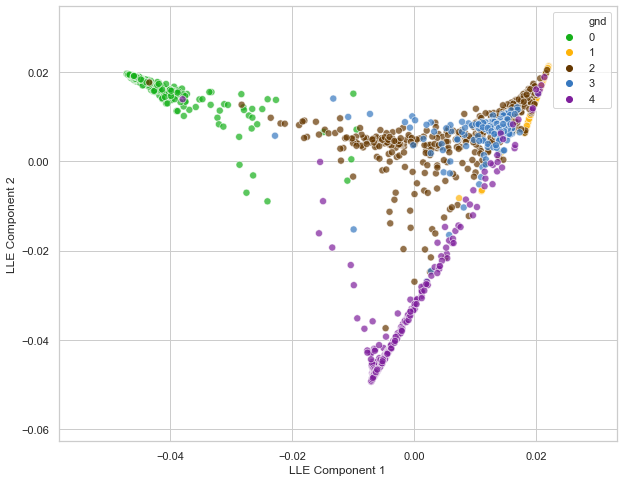

In [60]:
#Plotting LLE1 and LLE2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = ax, x="LLE Component 1", y="LLE Component 2", alpha = 0.7, s = 50,
                hue="gnd", data=df_lle, palette=sns.xkcd_palette(colors),legend='full')

From the above graph of LLE component 1 vs LLE component 2, we can observe the different classes somewhat clearly when compared to kernel PCA, Laplacian eigenmap but not more clear than T-SNE, Isomap. Although there is somewhat overlappig of classes, We can separate classes 1,4. But when coming to classes 0,2,3 we can see that they are clearly overlapped and separability is not possible. Due to this we may not expect the better accuracy, performance, confusion matrix.

If we keep the n_neighbors as default which is 5 we can't able to see the class 1 due to high overlapping. So I have selected n_neighbors as 7. When I have changed the n_neighbors i observed there is change in angle of rotation of classes. The overlapping of claases is high at right side of graph.

# LAPLACIAN EIGENMAP

Spectral Embedding is an approach to calculating a non-linear embedding. Scikit-learn implements Laplacian Eigenmaps, which finds a low dimensional representation of the data using a spectral decomposition of the graph Laplacian. The graph generated can be considered as a discrete approximation of the low dimensional manifold in the high dimensional space.

In [61]:
from sklearn.manifold import SpectralEmbedding
#Projectig data into 2-D
embedding = SpectralEmbedding(n_components=2, random_state=42)
print(embedding)
X_transformed = embedding.fit_transform(df)
X_transformed.shape

SpectralEmbedding(affinity='nearest_neighbors', eigen_solver=None, gamma=None,
                  n_components=2, n_jobs=None, n_neighbors=None,
                  random_state=42)


(2066, 2)

In [62]:
#Taking data in pandas datafram
df_eigen = pd.DataFrame(X_transformed)
df_eigen.columns = ['Laplacian Eigenmap Component 1', 'Laplacian Eigenmap Component 2']
df_eigen.head()

,Laplacian Eigenmap Component 1,Laplacian Eigenmap Component 2
0,0.003748,-0.000115
1,0.003848,-0.000155
2,0.002052,-0.000082
3,0.002793,0.000009
4,0.004163,-0.000274


In [63]:
#Joining the output label
df_eigen['gnd'] = labels
print(df_eigen.head())

   Laplacian Eigenmap Component 1  Laplacian Eigenmap Component 2  gnd
0                        0.003748                       -0.000115    0
1                        0.003848                       -0.000155    0
2                        0.002052                       -0.000082    0
3                        0.002793                        0.000009    0
4                        0.004163                       -0.000274    0


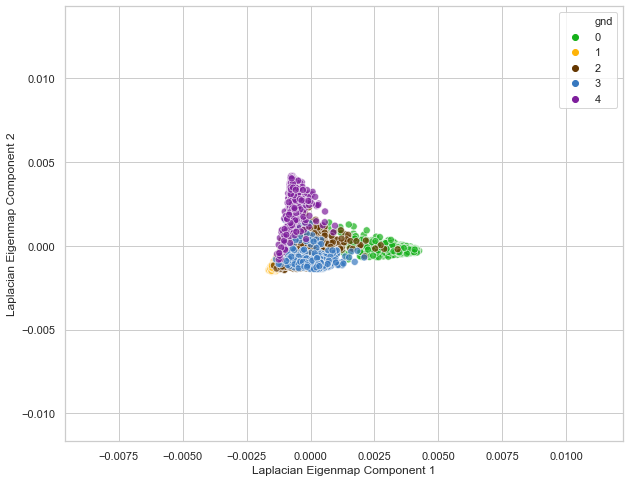

In [64]:
#Plotting Laplacian Eigenmap Component 1 and Laplacian Eigenmap Component 2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = ax, x="Laplacian Eigenmap Component 1", y="Laplacian Eigenmap Component 2", alpha = 0.7, s = 50,
                hue="gnd", data=df_eigen, palette=sns.xkcd_palette(colors))

From the above graph of Laplacian Eigenmap component 1 vs Laplacian Eigenmap component 2, we can observe the different classes somewhat clearly when compared to kernel PCA but not more clear than T-SNE, Isomap, LLE. Now the data is located at the center of the graph. If we increase the n_neighbors we can easily separate the classes clearly. But due to changing the n_neighbors, there will be change in smoothness, curvature, angle, rotation, accuracy of the model.

# T-SNE

T-SNE converts affinities of data points to probabilities. The affinities in the original space are represented by Gaussian joint probabilities and the affinities in the embedded space are represented by Student’s t-distributions. This allows t-SNE to be particularly sensitive to local structure and has a few other advantages over existing techniques:

Revealing the structure at many scales on a single map

Revealing data that lie in multiple, different, manifolds or clusters

Reducing the tendency to crowd points together at the center

In [65]:
from sklearn.manifold import TSNE
#Projecting data into 2-D
embedded = TSNE(n_components=2, random_state=42)
print(embedded)
X_embedded = embedded.fit_transform(df)
X_embedded.shape

TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
     method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
     n_components=2, n_iter=1000, n_iter_without_progress=300, n_jobs=None,
     perplexity=30.0, random_state=42, verbose=0)


(2066, 2)

In [66]:
#Taking data into dataframe
df_tsne = pd.DataFrame(X_embedded)
df_tsne.columns = ['T-SNE Component 1', 'T-SNE Component 2']
df_tsne.head()

,T-SNE Component 1,T-SNE Component 2
0,-53.829792,-7.473398
1,-54.410954,-8.699940
2,-43.849453,-0.206238
3,-44.894676,-3.201985
4,-60.210205,-7.863094


In [67]:
#Joining Output label
df_tsne['gnd'] = labels
print(df_tsne.head())

   T-SNE Component 1  T-SNE Component 2  gnd
0         -53.829792          -7.473398    0
1         -54.410954          -8.699940    0
2         -43.849453          -0.206238    0
3         -44.894676          -3.201985    0
4         -60.210205          -7.863094    0


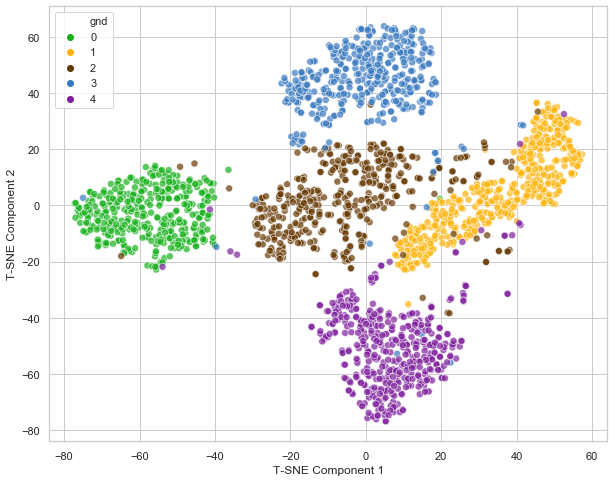

In [68]:
#Plotting T-SNE Component 1 and T-SNE Component 2
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 8))
colors = ["green", "amber", "brown", "windows blue", "purple"]
sns.scatterplot(ax = ax, x="T-SNE Component 1", y="T-SNE Component 2", alpha = 0.7, s = 50,
                hue="gnd", data=df_tsne, palette=sns.xkcd_palette(colors))

From the above graph of T-SNE component 1 vs T-SNE component 2, We can oberserve different classes clearly and separability of classes is easy.

T-SNE is the best method for this data when compared to above methods like Isomap,LLE,Laplacian Eigenmap,Kernel PCA interms of feature separability, smoothness, curvature, angle and rotation. More the separability of classes higher will be the accuracy, performance of model. We can separate the classs easily by writing simple conditional loops.

To conclude, based on above tradeoffs,analysis from different methods, considering all parameters, we can say that T-SNA is the best method for this dataset.